In [1]:
import os

CHROM="chr19"
BINSIZE=25000
OUTPUT_FOLDER=f"/home/agalicina/IMMUNE/joint-decomposition/results/decomp_proj_cis_{CHROM}/"
if not os.path.isdir(OUTPUT_FOLDER):
    os.mkdir(OUTPUT_FOLDER)
    
MODE="W" # "R" # is you want to read from existing output

### Is cis eigendecomposition of the dataset

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.append('/home/agalicina/IMMUNE/joint-decomposition/')
sys.path.append('/home/agalicina/soft/sandbox/pySTATIS')

In [4]:
import joint_lib
import tqdm

In [5]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import proplot

# Plotting parameters:
proplot.rc['figure.facecolor'] = 'white'
proplot.rc.update(
    linewidth=1, fontsize=10,
    color='dark blue', suptitlecolor='dark blue',
    titleloc='upper center', titlecolor='dark blue', titleborder=False,
)
mpl.rcParams['font.sans-serif'] = "Arial" # Set the font
mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['grid.alpha'] = 0 # Remove the grid
mpl.rcParams['xtick.minor.bottom'] = False # Remove minor ticks
mpl.rcParams['ytick.minor.left'] = False
mpl.rcParams['ytick.minor.right'] = False

import bioframe
import cooler

In [6]:
N_EIGS = 128
CHROMSIZES = bioframe.fetch_chromsizes('mm10', filter_chroms=True)
CHROMOSOMES = list(CHROMSIZES[:'chrX'].index)

genomic_viewframe = bioframe.make_viewframe(CHROMSIZES).query(f'chrom in {CHROMOSOMES}').reset_index(drop=True)

chunksize = 2000000

COOLER_PATHS = {
    'undiff_unstim': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library_group/undiff_unstim.mm10.mapq_30.1000.mcool',
    'cDC_unstim': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library_group/cDC_unstim.mm10.mapq_30.1000.mcool',
    'pDC_unstim': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library_group/pDC_unstim.mm10.mapq_30.1000.mcool',
    'pDC_CpGA': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library_group/pDC_CpGA.mm10.mapq_30.1000.mcool',

    'IRF8KO': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library_group/IRF8KO_HoxB8.mm10.mapq_30.1000.mcool',
    'SMC3KO_cDC': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library_group/SMC3KO_cDC.mm10.mapq_30.1000.mcool',
    'SMC3KO_pDC': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library_group/SMC3KO_pDC.mm10.mapq_30.1000.mcool',
    'WT_cDC': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library_group/WT_cDC.mm10.mapq_30.1000.mcool',
    'WT_pDC': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library_group/WT_pDC.mm10.mapq_30.1000.mcool',
    
    'cDC_unstim_R1': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/cDC_unstim_01_S2.mm10.mapq_30.1000.mcool',
    'cDC_unstim_R2': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/cDC_unstim_02_S6.mm10.mapq_30.1000.mcool',
    'pDC_CpGA_R1': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/pDC_CpGA_01_S4.mm10.mapq_30.1000.mcool',
    'pDC_CpGA_R2': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/pDC_CpGA_02_S8.mm10.mapq_30.1000.mcool',
    'pDC_unstim_R1': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/pDC_unstim_01_S3.mm10.mapq_30.1000.mcool',
    'pDC_unstim_R2': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/pDC_unstim_02_S7.mm10.mapq_30.1000.mcool',
    'undiff_unstim_R1': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/undiff_unstim_01_S1.mm10.mapq_30.1000.mcool',
    'undiff_unstim_R2': '/net/levsha/share/lab/reizis2020/disiller_0.3.3-mm10/results/coolers_library/undiff_unstim_02_S5.mm10.mapq_30.1000.mcool',
    'IRF8KO_R1': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/IRF8KO_HoxB8_01_S9.mm10.mapq_30.1000.mcool',
    'IRF8KO_R2': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/IRF8KO_HoxB8_02_S10.mm10.mapq_30.1000.mcool',
    'SMC3KO_cDC_R1': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/SMC3KO_cDC_01_S5.mm10.mapq_30.1000.mcool',
    'SMC3KO_cDC_R2': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/SMC3KO_cDC_02_S6.mm10.mapq_30.1000.mcool',
    'SMC3KO_pDC_R1': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/SMC3KO_pDC_01_S7.mm10.mapq_30.1000.mcool',
    'SMC3KO_pDC_R2': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/SMC3KO_pDC_02_S8.mm10.mapq_30.1000.mcool',
    'WT_cDC_R1': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/WT_cDC_01_S1.mm10.mapq_30.1000.mcool',
    'WT_cDC_R2': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/WT_cDC_02_S2.mm10.mapq_30.1000.mcool',
    'WT_pDC_R1': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/WT_pDC_01_S3.mm10.mapq_30.1000.mcool',
    'WT_pDC_R2': '/net/levsha/share/lab/reizis2020/distiller_0.3.3-mm10_mutants/results/coolers_library/WT_pDC_02_S4.mm10.mapq_30.1000.mcool',

    }

CONDITIONS = [
    'undiff_unstim',
    'cDC_unstim',
    'pDC_unstim',
    'pDC_CpGA',
    'IRF8KO',
    'SMC3KO_cDC',
    'SMC3KO_pDC',
    'WT_cDC',
    'WT_pDC',
    # 'cDC_unstim_R1', 
    # 'cDC_unstim_R2', 
    # 'pDC_CpGA_R1', 
    # 'pDC_CpGA_R2', 
    # 'pDC_unstim_R1', 
    # 'pDC_unstim_R2', 
    # 'undiff_unstim_R1', 
    # 'undiff_unstim_R2', 
    # 'IRF8KO_R1', 
    # 'IRF8KO_R2', 
    # 'SMC3KO_cDC_R1', 
    # 'SMC3KO_cDC_R2', 
    # 'SMC3KO_pDC_R1', 
    # 'SMC3KO_pDC_R2', 
    # 'WT_cDC_R1', 
    # 'WT_cDC_R2', 
    # 'WT_pDC_R1', 
    # 'WT_pDC_R2',
]

In [7]:
cols_annotations = ['cond', 'model', 'stage', 'treatment', 'genotype', 'replica']
ANNOTATIONS = [
    ['undiff_unstim', 'HoxB8', 'undiff', 'unstim', 'WT', 'merged'],
    ['cDC_unstim', 'HoxB8', 'cDC', 'unstim', 'WT', 'merged'],
    ['pDC_unstim', 'HoxB8', 'pDC', 'unstim', 'WT', 'merged'],
    ['pDC_CpGA', 'HoxB8', 'pDC', 'stim', 'WT', 'merged'],
    ['IRF8KO', 'HoxB8', 'undiff', 'unstim', 'IRF8KO', 'merged'],
    ['SMC3KO_cDC', 'bone marrow', 'cDC', 'unstim', 'SMC3KO', 'merged'],
    ['SMC3KO_pDC', 'bone marrow', 'pDC', 'unstim', 'SMC3KO', 'merged'],
    ['WT_cDC', 'bone marrow', 'cDC', 'unstim', 'WT', 'merged'],
    ['WT_pDC', 'bone marrow', 'pDC', 'unstim', 'WT', 'merged'],
    # ['cDC_unstim_R1', 'HoxB8', 'cDC', 'unstim', 'WT', 'R1'],
    # ['cDC_unstim_R2', 'HoxB8', 'cDC', 'unstim', 'WT', 'R2'],
    # ['pDC_CpGA_R1', 'HoxB8', 'pDC', 'stim', 'WT', 'R1'],
    # ['pDC_CpGA_R2', 'HoxB8', 'pDC', 'stim', 'WT', 'R2'],
    # ['pDC_unstim_R1', 'HoxB8', 'pDC', 'unstim', 'WT', 'R1'],
    # ['pDC_unstim_R2', 'HoxB8', 'pDC', 'unstim', 'WT', 'R2'],
    # ['undiff_unstim_R1', 'HoxB8', 'undiff', 'unstim', 'WT', 'R1'],
    # ['undiff_unstim_R2', 'HoxB8', 'undiff', 'unstim', 'WT', 'R2'],
    # ['IRF8KO_R1', 'HoxB8', 'undiff', 'unstim', 'IRF8KO', 'R1'],
    # ['IRF8KO_R2', 'HoxB8', 'undiff', 'unstim', 'IRF8KO', 'R2'],
    # ['SMC3KO_cDC_R1', 'bone marrow', 'cDC', 'unstim', 'SMC3KO', 'R1'],
    # ['SMC3KO_cDC_R2', 'bone marrow', 'cDC', 'unstim', 'SMC3KO', 'R2'],
    # ['SMC3KO_pDC_R1', 'bone marrow', 'pDC', 'unstim', 'SMC3KO', 'R1'],
    # ['SMC3KO_pDC_R2', 'bone marrow', 'pDC', 'unstim', 'SMC3KO', 'R2'],
    # ['WT_cDC_R1', 'bone marrow', 'cDC', 'unstim', 'WT', 'R1'],
    # ['WT_cDC_R2', 'bone marrow', 'cDC', 'unstim', 'WT', 'R2'],
    # ['WT_pDC_R1', 'bone marrow', 'pDC', 'unstim', 'WT', 'R1'],
    # ['WT_pDC_R2', 'bone marrow', 'pDC', 'unstim', 'WT', 'R2'],
]

ANNOTATIONS = pd.DataFrame(ANNOTATIONS, columns=cols_annotations)

In [8]:
# Read epigenetics and create a bin table:
cond = CONDITIONS[0]
bins = cooler.Cooler(COOLER_PATHS[cond] + f"::/resolutions/{BINSIZE}").bins()[:]
bins = bioframe.trim(bins, bioframe.make_viewframe(CHROMSIZES)).dropna(subset='chrom').reset_index(drop=True)

# Annotate GC content:
gc = pd.read_table(f"/net/levsha/share/lab/reizis2020/tracks/00_bin_annotations/results/mm10.bins.gc.{BINSIZE}.tsv")
bins = pd.merge(gc, bins, on=['chrom', 'start', 'end'])

# Annotate telomeric-centromeric distance:
bins = bioframe.overlap( bins, bioframe.make_viewframe(CHROMSIZES), suffixes=('', '_region') )
bins.loc[:, 'telomeric_distance'] = bins.apply(lambda x: min(x.start-x.start_region, x.end_region-x.end), axis=1)

# Read annotations of the epigenetics
df_annot = pd.read_table(f"/net/levsha/share/lab/reizis2020/tracks/00_bin_annotations/results/all_bigwigs_binned.{BINSIZE}.tsv", index_col=0).drop(['weight'], axis=1)
bins = pd.merge(df_annot, bins, on=['chrom', 'start', 'end'])

In [9]:
region = CHROM
bins_region = bioframe.select(bins, region).reset_index(drop=True)

In [10]:
genomic_viewframe.query(f'name=="{region}"')

,chrom,start,end,name
18,chr19,0,61431566,chr19


In [11]:
COOLERS_DICT = joint_lib.preload_coolers(COOLER_PATHS, CONDITIONS, BINSIZE)

In [12]:
### Load cis heatmaps:
MTX_DICT = {}
for cond in CONDITIONS:
    print(cond)
    
    clr = COOLERS_DICT[cond]

    MTX_DICT[cond] = dict(joint_lib.retrieve_cis_matrices(
        clr=clr,
        view_df=genomic_viewframe.query(f'name=="{region}"'),
        verbose=True,
        ignore_diags=150_000//BINSIZE
    ))

undiff_unstim


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  7.09s/it]


cDC_unstim


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.16it/s]


pDC_unstim


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.77it/s]


pDC_CpGA


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.29it/s]


IRF8KO


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.94it/s]


SMC3KO_cDC


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.51it/s]


SMC3KO_pDC


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.05it/s]


WT_cDC


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.80it/s]


WT_pDC


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.29it/s]


In [13]:
MTX_DICT['undiff_unstim'][region].shape

(615, 615)

In [14]:
### Optional read the output if it's available

import pickle

if MODE.startswith("R"):
    OUTPUT_STATIS = pickle.load(open(f'{OUTPUT_FOLDER}/{CHROM}.{BINSIZE}.output_statis.pickle', 'rb'))

    bins_prev_analysis = pd.read_csv(f'{OUTPUT_FOLDER}/output_table.{CHROM}.{BINSIZE}.csv')
    # bins.loc[:, 'is_valid'] = bins_prev_analysis['is_bin_valid']
    # bins.loc[:, 'is_valid'] = bins.loc[:, 'is_valid'].fillna(False)
    GOOD_BINS = bins.loc[:, 'is_valid'].values
    
elif MODE.startswith("W"):
    JOINT_MTX, GOOD_BINS = joint_lib.list_to_filtered_array({cond:MTX_DICT[cond][region] for cond in CONDITIONS}, 
                                                            conditions=CONDITIONS, backend='STATIS', norm=None)
    OUTPUT_STATIS = joint_lib.run_pySTATIS(JOINT_MTX, N_EIGS)
    
    ### Store the output
    pickle.dump(OUTPUT_STATIS, open(f'{OUTPUT_FOLDER}/{CHROM}.{BINSIZE}.output_statis.pickle', 'wb'))
    
    bins_region.loc[:, "is_valid"] = GOOD_BINS
else:
    raise Exception(f"MODE {MODE} is not implemented")

undiff_unstim
        zeros ratio before zero rows removal: 25.75% 
        zeros ratio after zero rows removal: 8.38%
        
cDC_unstim
        zeros ratio before zero rows removal: 24.39% 
        zeros ratio after zero rows removal: 8.21%
        
pDC_unstim
        zeros ratio before zero rows removal: 23.96% 
        zeros ratio after zero rows removal: 8.56%
        
pDC_CpGA
        zeros ratio before zero rows removal: 27.37% 
        zeros ratio after zero rows removal: 12.61%
        
IRF8KO
        zeros ratio before zero rows removal: 19.13% 
        zeros ratio after zero rows removal: 3.02%
        
SMC3KO_cDC
        zeros ratio before zero rows removal: 20.42% 
        zeros ratio after zero rows removal: 4.92%
        
SMC3KO_pDC
        zeros ratio before zero rows removal: 18.69% 
        zeros ratio after zero rows removal: 4.47%
        
WT_cDC
        zeros ratio before zero rows removal: 19.18% 
        zeros ratio after zero rows removal: 4.77%
        
WT_pDC

In [15]:
np.sum(GOOD_BINS)

545

Eigenvalues (D) plot


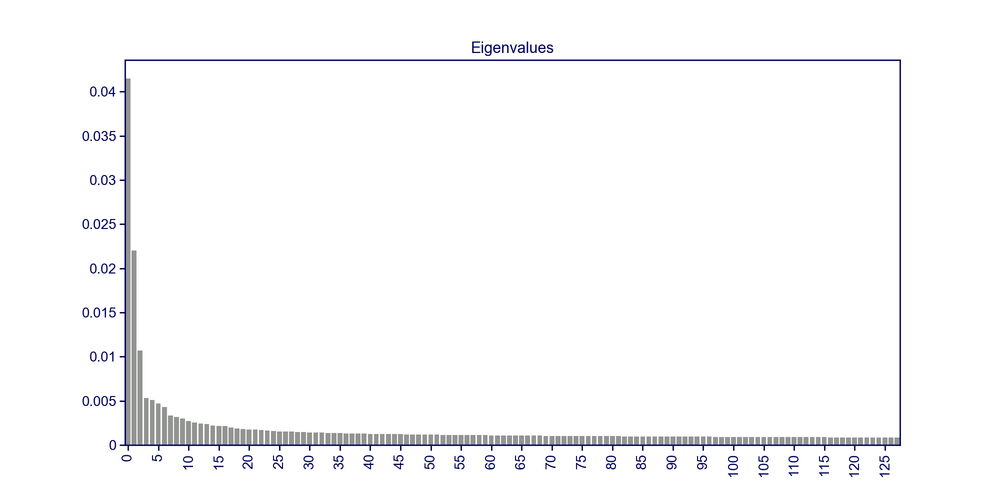

Percentage of variance explained:
[65.49553634 18.38564018  4.35487318  1.07201796  0.97862322  0.83849327
  0.70590167  0.42895235  0.38446171  0.33921767]
Component   % var     % cumulative
001         65.496     65.496
002         18.386     83.882
003         4.355     88.237
004         1.072     89.309
005         0.979     90.288
006         0.838     91.126
007         0.706     91.832
008         0.429     92.261
009         0.384     92.645
010         0.339     92.984
011         0.282     93.266
012         0.250     93.516
013         0.224     93.740
014         0.212     93.952
015         0.190     94.142
016         0.179     94.321
017         0.175     94.496
018         0.151     94.647
019         0.134     94.781
020         0.124     94.905
021         0.119     95.024
022         0.115     95.139
023         0.108     95.247
024         0.106     95.353
025         0.098     95.451
026         0.092     95.543
027         0.091     95.634
028         0.090     9

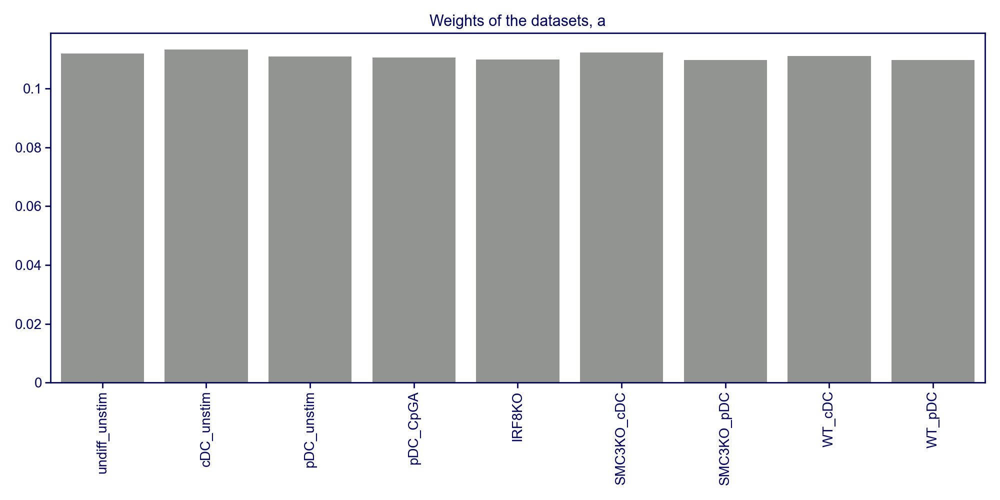

Heatmap of contributions of datasets to components


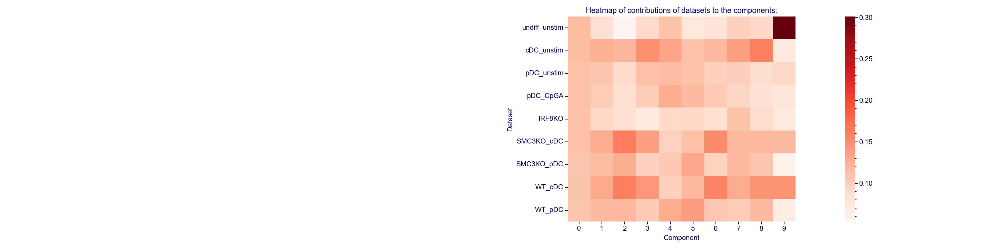

Contributions of genomic positions per component
Contribution of genomic positions per dataset into component 1
Quick scatterplots of loadings
Quick scatterplots of factor scores


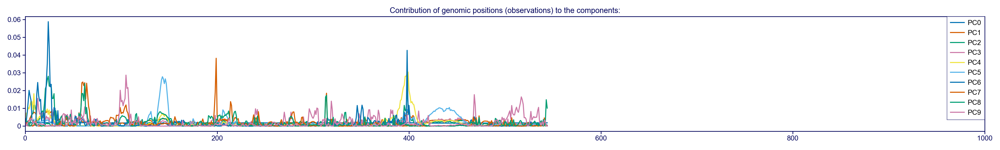

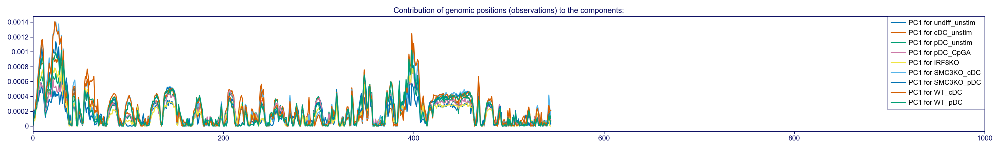

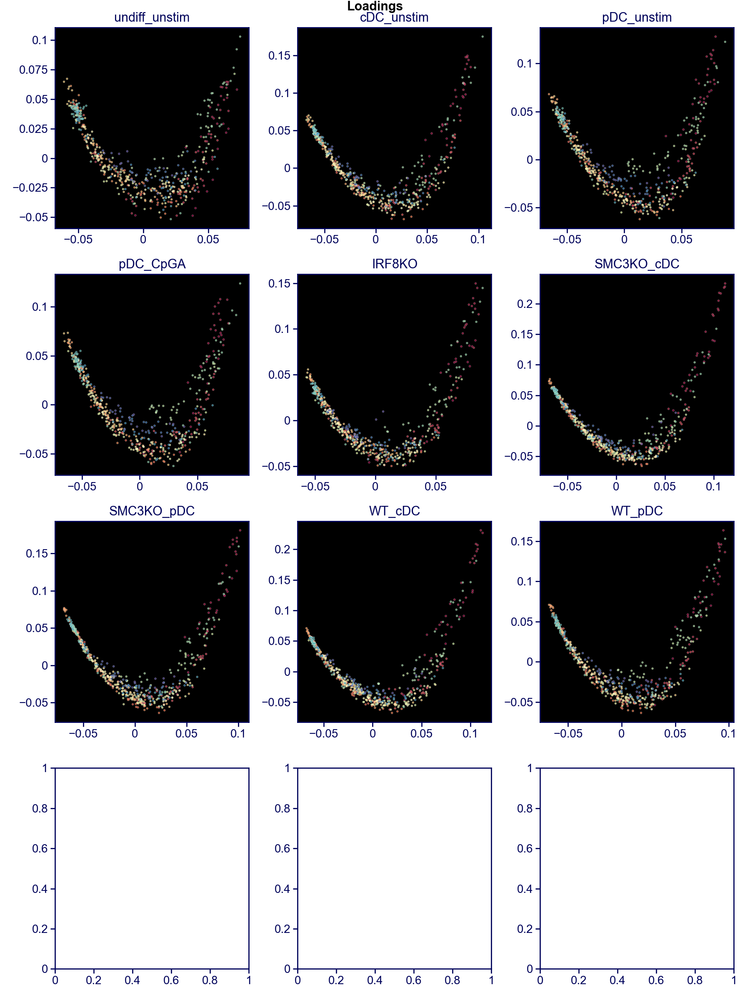

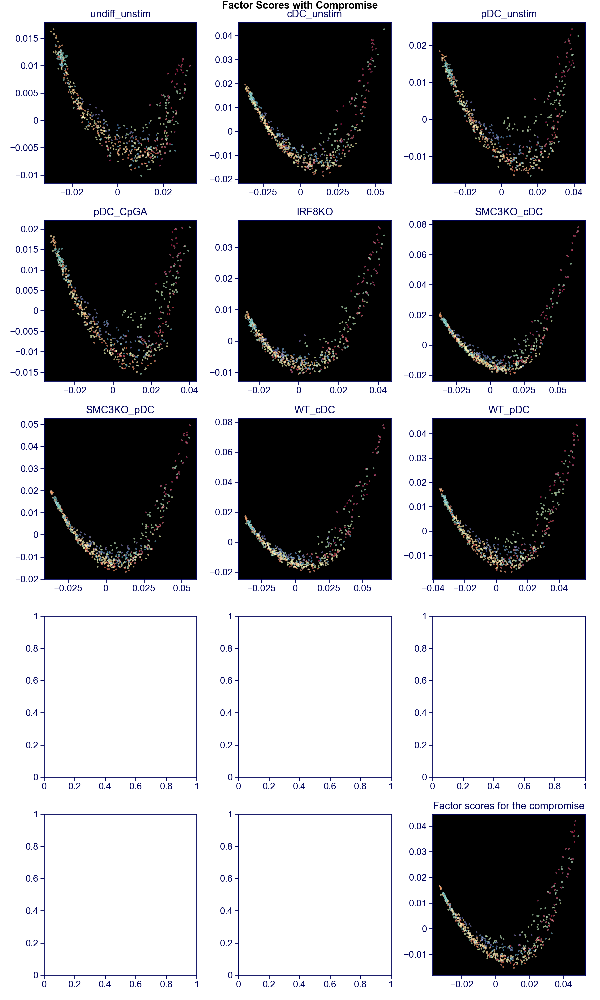

In [16]:
joint_lib.summary_STATIS(OUTPUT_STATIS, CONDITIONS, n_comp_plot=10, COMP_TARGET=1, REGION=(0, 1000) )

In [17]:
# Variance explained with 1st value
( 100*np.power(OUTPUT_STATIS.D_, 2) / sum(np.power(OUTPUT_STATIS.D_, 2)) )[:10]

array([65.49553634, 18.38564018,  4.35487318,  1.07201796,  0.97862322,
        0.83849327,  0.70590167,  0.42895235,  0.38446171,  0.33921767])

In [18]:
# Variance explained without 1st value
( 100*np.power(OUTPUT_STATIS.D_[1:], 2) / sum(np.power(OUTPUT_STATIS.D_[1:], 2)) )[:10]

array([53.28481661, 12.62118785,  3.10689646,  2.83622208,  2.43010086,
        2.0458271 ,  1.24317931,  1.11423761,  0.98311244,  0.81785246])

In [19]:
# Variance explained without 1st value, cumulative
( np.cumsum( 100 * np.power(OUTPUT_STATIS.D_[1:], 2) / sum(np.power(OUTPUT_STATIS.D_[1:], 2)) ) )[:13]

array([53.28481661, 65.90600447, 69.01290093, 71.84912301, 74.27922387,
       76.32505097, 77.56823028, 78.68246789, 79.66558033, 80.48343279,
       81.20654024, 81.85596676, 82.46960464])

### Projection to the consensus from cis to trans

In [20]:
N_COMP = n_comp = 10
bins_region, variance_explained = joint_lib.parse_statis_output(OUTPUT_STATIS, 
                                                                bins_region, 
                                                                CONDITIONS, 
                                                                good_bins=GOOD_BINS, 
                                                                n_comp=N_COMP+1)

In [21]:
cols_reference = [f'consensus-dimension:{i}' for i in range(N_COMP+1)]
reference = bins_region.loc[:, cols_reference].values

In [22]:
np.sum( bins_region.loc[:, 'is_bin_valid'] )

545

In [23]:
# Project to the consensus and store the output:
for cond in (pbar:= tqdm.tqdm(CONDITIONS)):
    pbar.set_postfix_str(cond)
    
    proj = joint_lib.transform(MTX_DICT[cond][region], reference, whiten=False, variance_explained=None)

    cols = [f'transformed:{cond}:{i}' for i in range(N_COMP+1)]
    bins_region.loc[:, cols] = proj

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 106.46it/s, WT_pDC]


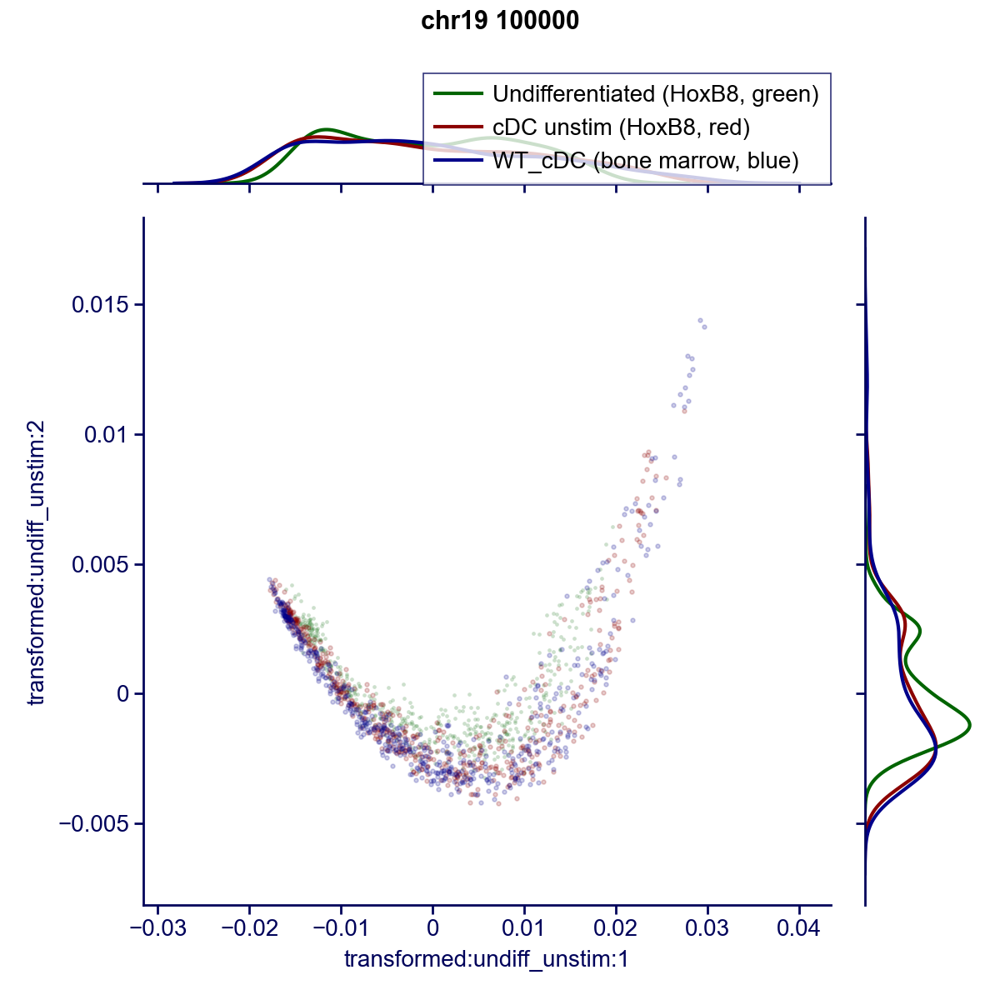

In [34]:
list_toplot = [
    ["undiff_unstim", "Undifferentiated (HoxB8, green)", 'darkgreen'],
    ["cDC_unstim", "cDC unstim (HoxB8, red)", 'darkred'],
    ["WT_cDC", "WT_cDC (bone marrow, blue)", 'darkblue'],
]
i1 = 1
i2 = 2
mode = "transformed"

axs = None
for cond, label, color in list_toplot:
    x = f'{mode}:{cond}:{i1}'
    y = f'{mode}:{cond}:{i2}'
    if axs is None:
        axs = sns.jointplot(
            x=x,
            y=y,
            data=bins_region,
            color=color,
            s=3,
            alpha=0.2,
            label=label,
            legend=False,
            marginal_kws={'alpha':0, 'edgecolor':'white'}
        )
    else:
        axs.ax_joint.scatter(x=x,
        y=y,
        data=bins_region,
        color=color,
        s=3,
        alpha=0.2,
        label=label,
    )       

    sns.kdeplot(bins_region[x], ax=axs.ax_marg_x, color=color, label=label)
    sns.kdeplot(bins_region[y], ax=axs.ax_marg_y, color=color, vertical=True)

# axs.ax_joint.legend()
axs.ax_marg_x.legend()

axs.fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)

plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.comp1-comp2.undif-cDC.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.comp1-comp2.undif-cDC.{CHROM}.{BINSIZE}.pdf")

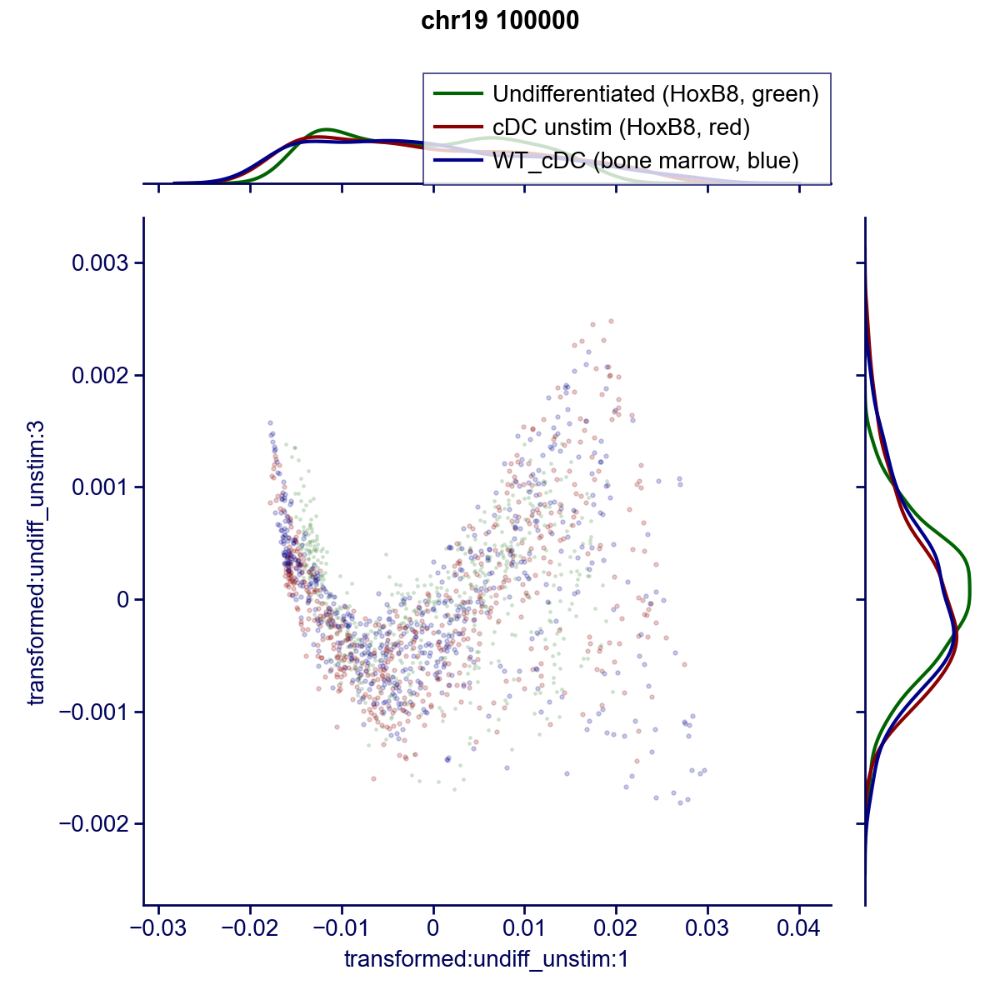

In [35]:
list_toplot = [
    ["undiff_unstim", "Undifferentiated (HoxB8, green)", 'darkgreen'],
    ["cDC_unstim", "cDC unstim (HoxB8, red)", 'darkred'],
    ["WT_cDC", "WT_cDC (bone marrow, blue)", 'darkblue'],
]
i1 = 1
i2 = 3
mode = "transformed"

axs = None
for cond, label, color in list_toplot:
    x = f'{mode}:{cond}:{i1}'
    y = f'{mode}:{cond}:{i2}'
    if axs is None:
        axs = sns.jointplot(
            x=x,
            y=y,
            data=bins_region,
            color=color,
            s=3,
            alpha=0.2,
            label=label,
            legend=False,
            marginal_kws={'alpha':0, 'edgecolor':'white'}
        )
    else:
        axs.ax_joint.scatter(x=x,
        y=y,
        data=bins_region,
        color=color,
        s=3,
        alpha=0.2,
        label=label,
    )       

    sns.kdeplot(bins_region[x], ax=axs.ax_marg_x, color=color, label=label)
    sns.kdeplot(bins_region[y], ax=axs.ax_marg_y, color=color, vertical=True)

# axs.ax_joint.legend()
axs.ax_marg_x.legend()

axs.fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)

plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.comp1-comp3.undif-cDC.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.comp1-comp3.undif-cDC.{CHROM}.{BINSIZE}.pdf")

### Correlation of projection length with the dymanic range of the data

In [36]:
dict_hic = {cond: MTX_DICT[cond][region][GOOD_BINS, :][:, GOOD_BINS].flatten() for cond in CONDITIONS}

In [37]:
mode = "transformed"

df_dispersion = []
for i in range(n_comp):
    dict_comp = {cond: bins_region[f'{mode}:{cond}:{i}'] for cond in CONDITIONS}
    for cond in CONDITIONS:
        x, x_err, y, y_err = np.nanmean(dict_hic[cond]), np.nanstd(dict_hic[cond]), np.nanmean(dict_comp[cond]), np.nanstd(dict_comp[cond])
        n_zeros = len(np.where(dict_hic[cond]==0)[0])
        df_dispersion.append([cond, x, x_err, y, y_err, n_zeros, i])
    
df_dispersion = pd.DataFrame( df_dispersion, 
                             columns=['cond', 'mean_hic', 'dispersion_hic', 'mean_comp', 'disperstion_comp', 'n_zeros', 'comp'] )
df_dispersion = pd.merge(ANNOTATIONS, df_dispersion, on='cond')

In [39]:
df_dispersion.head()

,cond,model,stage,treatment,genotype,replica,mean_hic,dispersion_hic,mean_comp,disperstion_comp,n_zeros,comp
0,undiff_unstim,HoxB8,undiff,unstim,WT,merged,0.001805,0.001394,4.081803e-02,0.000477,24876,0
1,undiff_unstim,HoxB8,undiff,unstim,WT,merged,0.001805,0.001394,-4.118085e-04,0.009768,24876,1
2,undiff_unstim,HoxB8,undiff,unstim,WT,merged,0.001805,0.001394,6.406266e-05,0.001852,24876,2
3,undiff_unstim,HoxB8,undiff,unstim,WT,merged,0.001805,0.001394,6.948028e-06,0.000586,24876,3
4,undiff_unstim,HoxB8,undiff,unstim,WT,merged,0.001805,0.001394,7.724268e-07,0.000596,24876,4


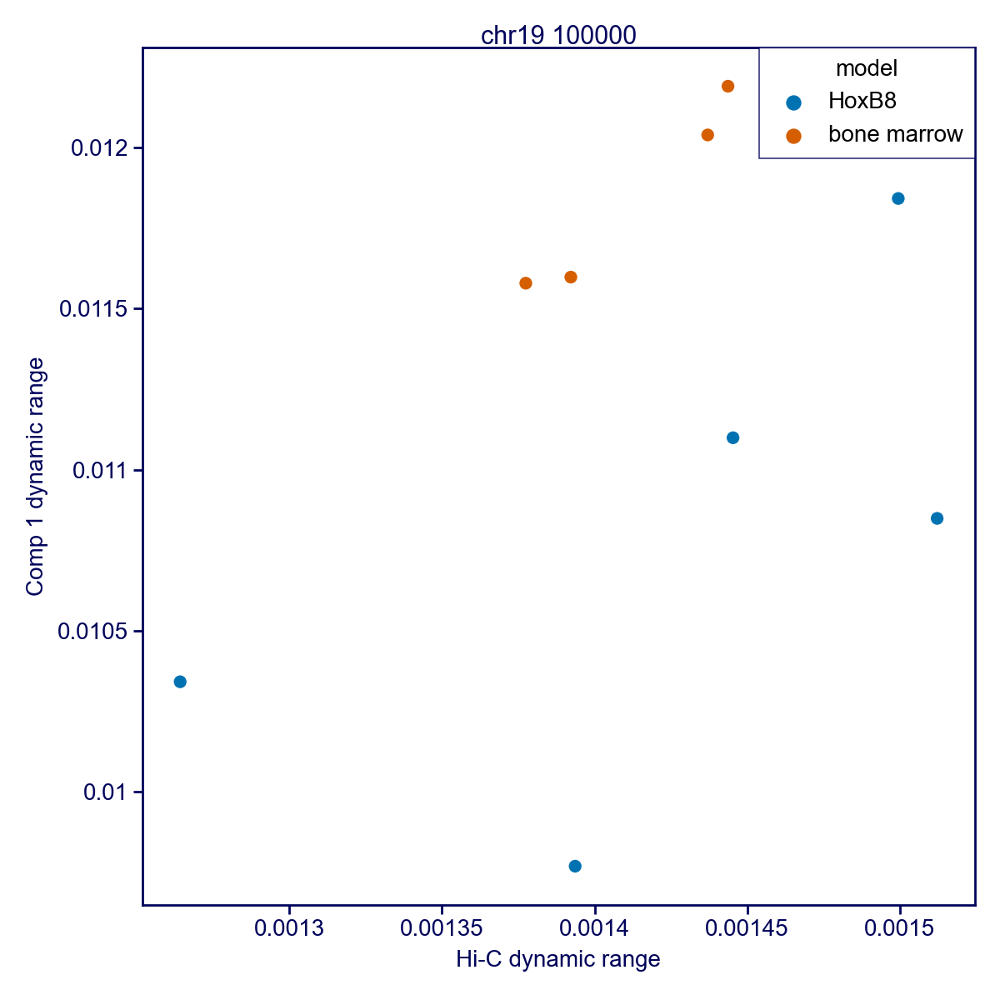

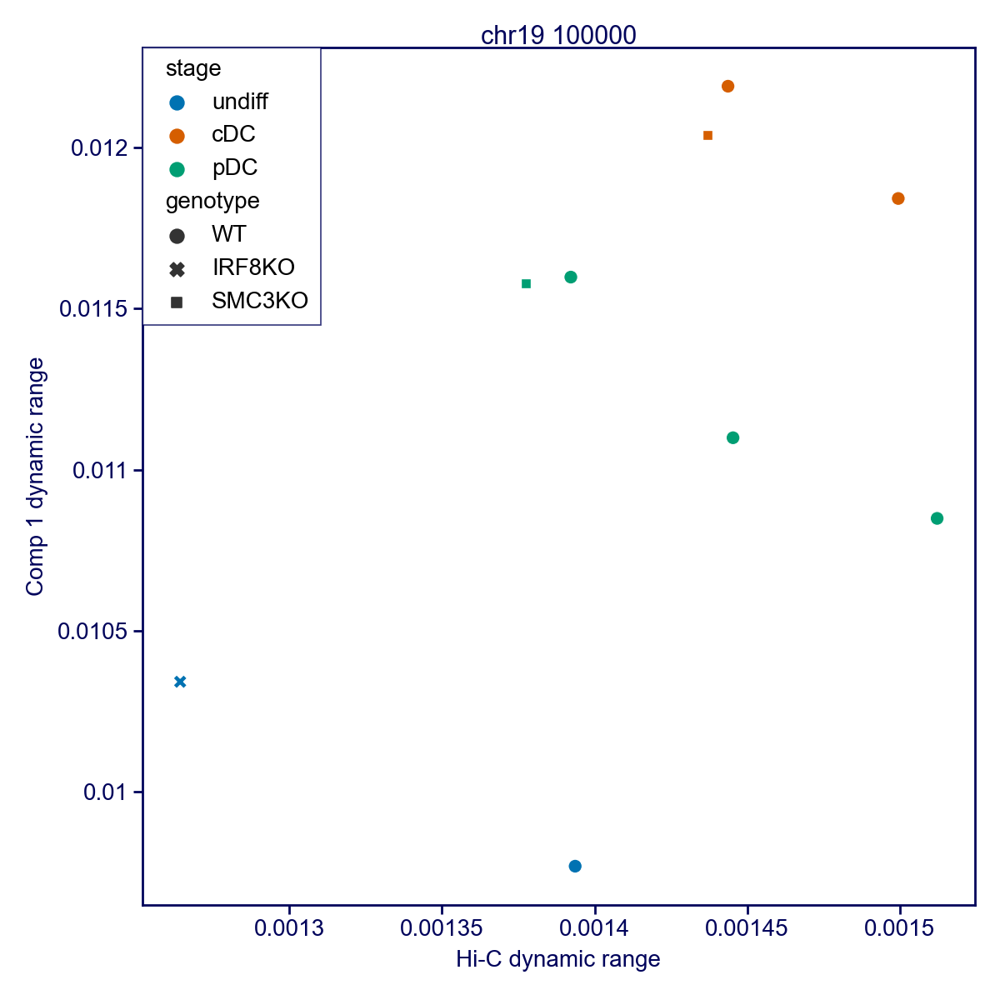

In [40]:
i = 1

plt.figure(figsize=[6, 6])
sns.scatterplot( data=df_dispersion.query(f'comp=={i}'), x='dispersion_hic', y='disperstion_comp', hue='model')
plt.xlabel('Hi-C dynamic range')
plt.ylabel(f'Comp {i} dynamic range')
plt.title(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange.bysystem.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange.bysystem.{CHROM}.{BINSIZE}.pdf")

plt.figure(figsize=[6, 6])
sns.scatterplot( data=df_dispersion.query(f'comp=={i}'), x='dispersion_hic', y='disperstion_comp', hue='stage', style='genotype')
plt.xlabel('Hi-C dynamic range')
plt.ylabel(f'Comp {i} dynamic range')
plt.title(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange.byexp.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange.byexp.{CHROM}.{BINSIZE}.pdf")

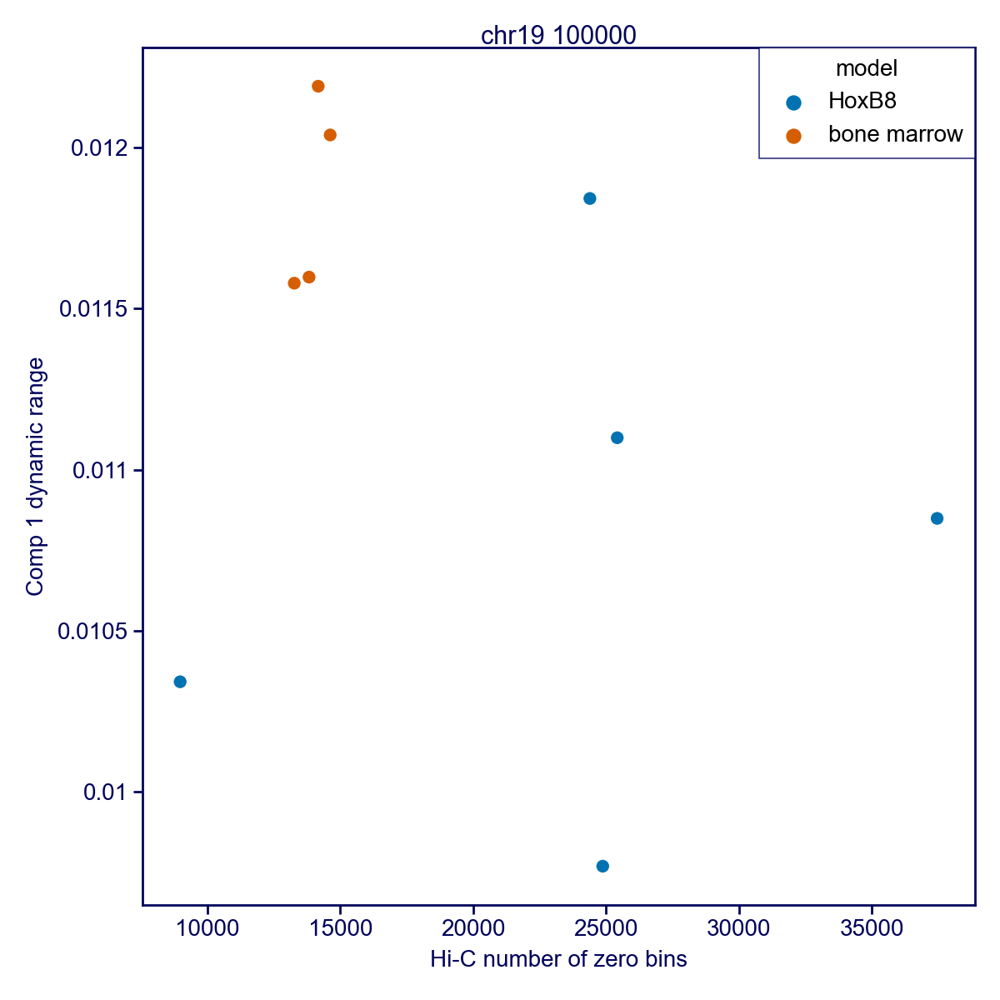

In [42]:
i = 1

plt.figure(figsize=[6, 6])
sns.scatterplot( data=df_dispersion.query(f'comp=={i}'), x='n_zeros', y='disperstion_comp', hue='model')
plt.xlabel('Hi-C number of zero bins')
plt.ylabel(f'Comp {i} dynamic range')
plt.title(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange-nnz.bysystem.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatterplot.dynrange-nnz.bysystem.{CHROM}.{BINSIZE}.pdf")

### K-means clustering

In [43]:
from sklearn.cluster import KMeans

In [44]:
conditions = list(ANNOTATIONS.sort_values(['model', 'stage', 'genotype', 'treatment']).cond.values)
mode = "transformed"
n_comp = n_comp
n_clusters = 6
n_bins = len(bins_region)
n_datasets = len(conditions)
output_name = f"cluster-{mode}"

exclude_components = [0] # 0 is mean
n_comp_factual = n_comp-len(exclude_components)

In [45]:
arr_toclust = np.concatenate(
    [bins_region.loc[:, [f"{mode}:{cond}:{n}" for n in range(1, n_comp+1) if n not in exclude_components]] for cond in conditions], 
    axis=0)
is_good = np.all(np.isfinite(arr_toclust), axis=1)
arr_toclust_collapsed = arr_toclust[is_good]

arr_toeval = np.concatenate(
    [bins_region.loc[:, [f"{mode}:{cond}:{n}" for n in range(1, n_comp+1) if n not in exclude_components]] for cond in conditions], 
    axis=0)
is_good = np.all(np.isfinite(arr_toeval), axis=1)
arr_toeval_collapsed = arr_toeval[is_good]

In [46]:
# # Cluster compromise
# cols_toclust = bins.loc[:, 'consensus-dimension:1':f'consensus-dimension:{n_comp}'].columns.values
# cols_toeval = [f"{mode}:{cond}:{n}" for n in range(1, n_comp+1)]

# arr_toclust = np.concatenate([bins.loc[:, cols_toclust] for cond in conditions], axis=0)
# is_good = np.all(np.isfinite(arr_toclust), axis=1)
# arr_toclust_collapsed = arr_toclust[is_good]

# arr_toeval = np.concatenate([bins.loc[:, cols_toeval] for cond in conditions], axis=0)
# is_good = np.all(np.isfinite(arr_toeval), axis=1)
# arr_toeval_collapsed = arr_toeval[is_good]

In [47]:
model = KMeans(
    n_clusters=n_clusters,
    # init='k-means++',
    # n_init=100,
    # max_iter=10000,
    # tol=0.00001,
    verbose=0,
    random_state=42,
    algorithm='auto',
)

labels = np.full(shape=n_bins*n_datasets, fill_value=n_clusters)
model.fit(arr_toclust_collapsed)
labels[is_good] = model.predict(arr_toeval_collapsed)

labels = labels.reshape([n_bins, n_datasets], order='F')

# Write the output: 
output_cols = [f"{output_name}:{cond}" for cond in conditions]
bins_region.loc[:, output_cols] = labels
bins_region.loc[:, output_cols] = bins_region.loc[:, output_cols].astype('category')

In [48]:
np.unique(labels)

array([0, 1, 2, 3, 4, 5, 6])

In [49]:
cond = 'undiff_unstim'
col = f'cluster-{mode}:{cond}'

cond1 = 'WT_cDC'
col1 = f'cluster-{mode}:{cond1}'

bins_region.groupby([col, col1]).count()[['chrom']].query('chrom!=0').head()

chrom
cluster-transformed:undiff_unstim cluster-transformed:WT_cDC       
0                                 0                              52
                                  1                               7
                                  3                              30
                                  4                              29
1                                 1                              72

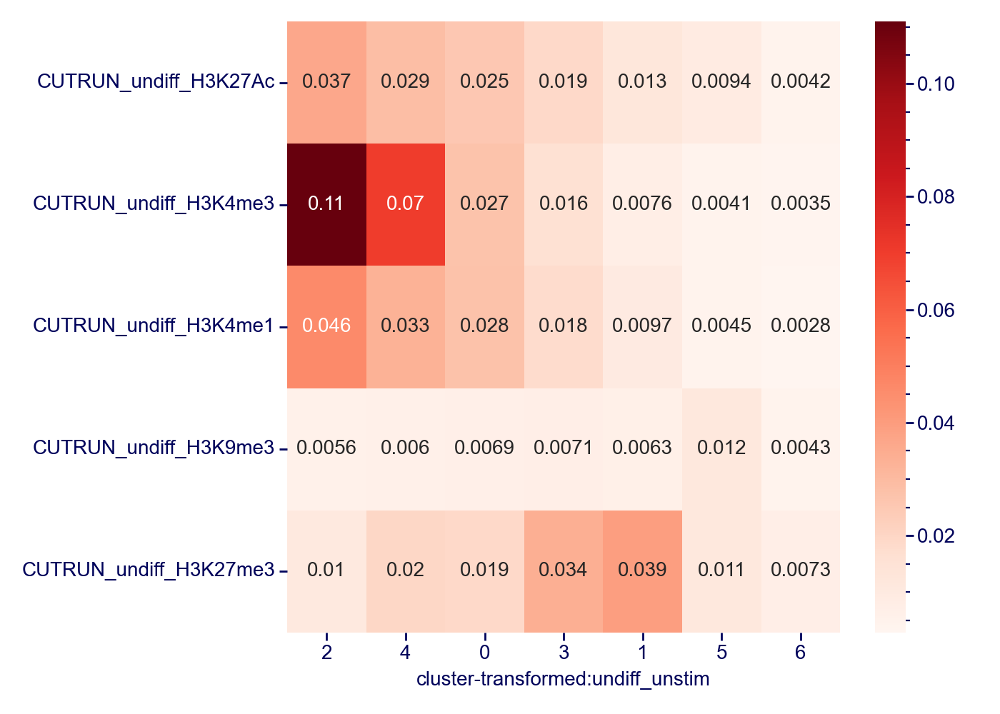

In [50]:
# Visually assess reordering:
cond = 'undiff_unstim'
col = f'cluster-{mode}:{cond}'
col_toplot = [
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K9me3',
    'CUTRUN_undiff_H3K27me3',
]

df_toplot = bins_region.groupby(col).mean()[col_toplot]
plt.figure(figsize=[7, 5])
sns.heatmap(df_toplot.sort_values(['CUTRUN_undiff_H3K27Ac', 'CUTRUN_undiff_H3K4me3'], ascending=False).T, cmap='Reds', annot=True)
plt.tight_layout()

In [51]:
list_cluster_reorder = list( df_toplot.sort_values(['CUTRUN_undiff_H3K27Ac', 'CUTRUN_undiff_H3K4me3'], ascending=False).T.columns.values )
# dict_cluster_names = dict(enumerate(['A1', 'A2', 'Bi', 'Polycomb', 'B1', 'B2', 'Quies']))

In [52]:
# Re-order the clusters:
bins_region.loc[:, output_cols] = (bins_region.loc[:, output_cols].replace( list_cluster_reorder, 2*n_clusters+np.arange(n_clusters+1) ).astype(int)-2*n_clusters).astype('category')

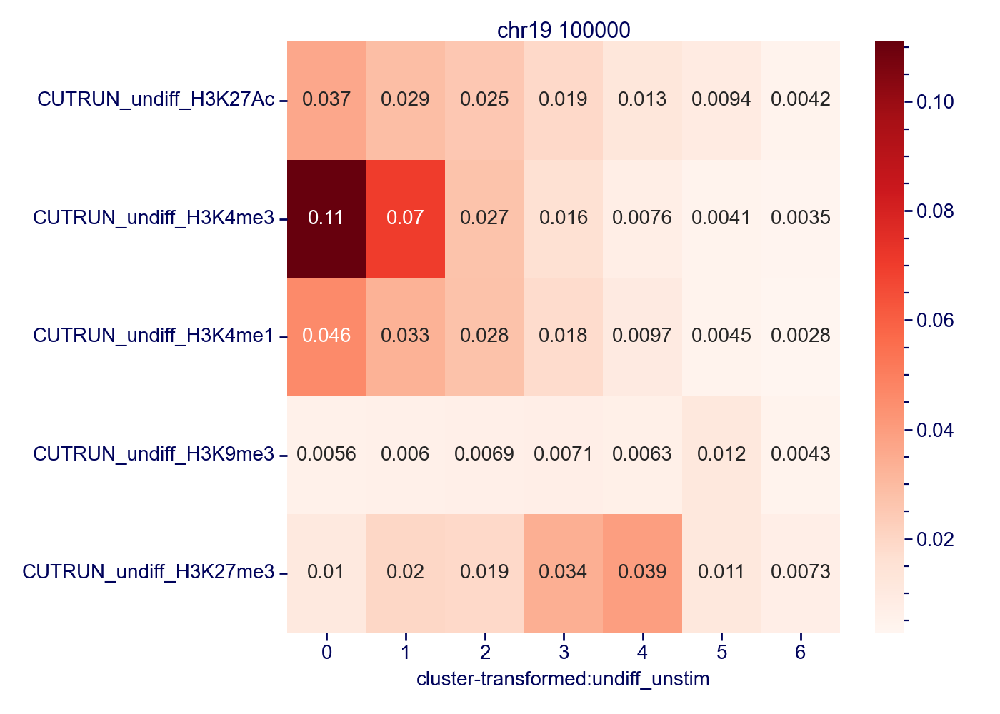

In [53]:
# Check re-ordering
cond = 'undiff_unstim'
col = f'cluster-{mode}:{cond}'
col_toplot = [
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K9me3',
    'CUTRUN_undiff_H3K27me3',
]

df_toplot = bins_region.groupby(col).mean()[col_toplot]
plt.figure(figsize=[7, 5])
sns.heatmap(df_toplot.sort_values(['CUTRUN_undiff_H3K27Ac', 'CUTRUN_undiff_H3K4me3'], ascending=False).T, cmap='Reds', annot=True)

plt.title(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/heatmap.clusters-annotation.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/heatmap.clusters-annotation.{CHROM}.{BINSIZE}.pdf")

### Scatterplots together with epigenetics

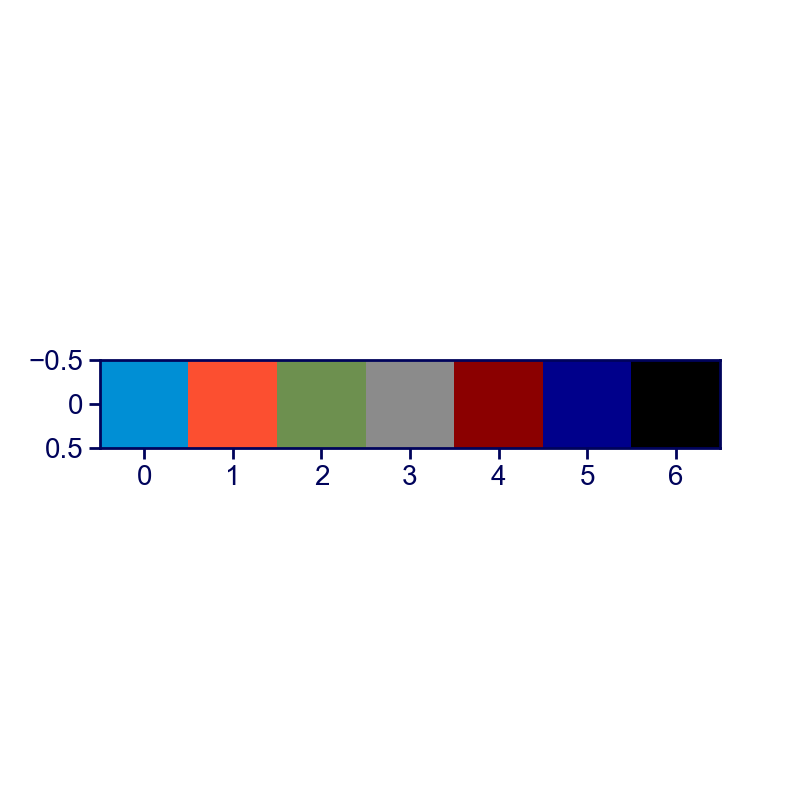

In [64]:
palette = sns.color_palette('538')
cmap = mpl.colors.ListedColormap(list(palette)+['darkred', 'darkblue', 'black'])
plt.imshow(np.arange(n_clusters+1).reshape(1, n_clusters+1),
           cmap=cmap,
           interpolation="nearest", aspect="equal")

In [ ]:
kwargs_cont = dict(
    palette='spectral',
    s=5,
    alpha=0.5,
)

kwargs_cont_marks = dict(kwargs_cont)
kwargs_cont_marks.update( {'hue_norm':mpl.colors.Normalize(vmin=1e-4, vmax=1)} )

kwargs_discrete = dict(
    s=5,
    palette=cmap.colors,
    alpha=0.5,
)

annotations = [
    ['GC', kwargs_cont],
    ['chrom', kwargs_discrete],
    ['telomeric_distance', kwargs_cont],
    ['cluster-transformed:undiff_unstim', kwargs_discrete],
    ['CUTRUN_undiff_H3K27Ac', kwargs_cont_marks],
    ['CUTRUN_undiff_H3K4me3', kwargs_cont],
    ['CUTRUN_undiff_H3K4me1', kwargs_cont],
    ['CUTRUN_undiff_H3K27me3', kwargs_cont],
    ['CUTRUN_undiff_H3K9me3', kwargs_cont],
]

x = 'transformed:undiff_unstim:1'
y = 'transformed:undiff_unstim:2'

nplots = len(annotations)
ncols = 3 
nrows = int(np.ceil(nplots/ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=[ncols*6, nrows*6])
axes = axes.flatten()

for i, annot in enumerate(annotations):
    col, kwargs = annot
    ax=axes[i]
    sns.scatterplot(
        x=x,
        y=y,
        data=bins_region,
        hue=col,
        ax=ax,
        **kwargs,
    )


fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatter.cluster-annotation.comp1-comp2.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatter.cluster-annotation.comp1-comp2.{CHROM}.{BINSIZE}.pdf")

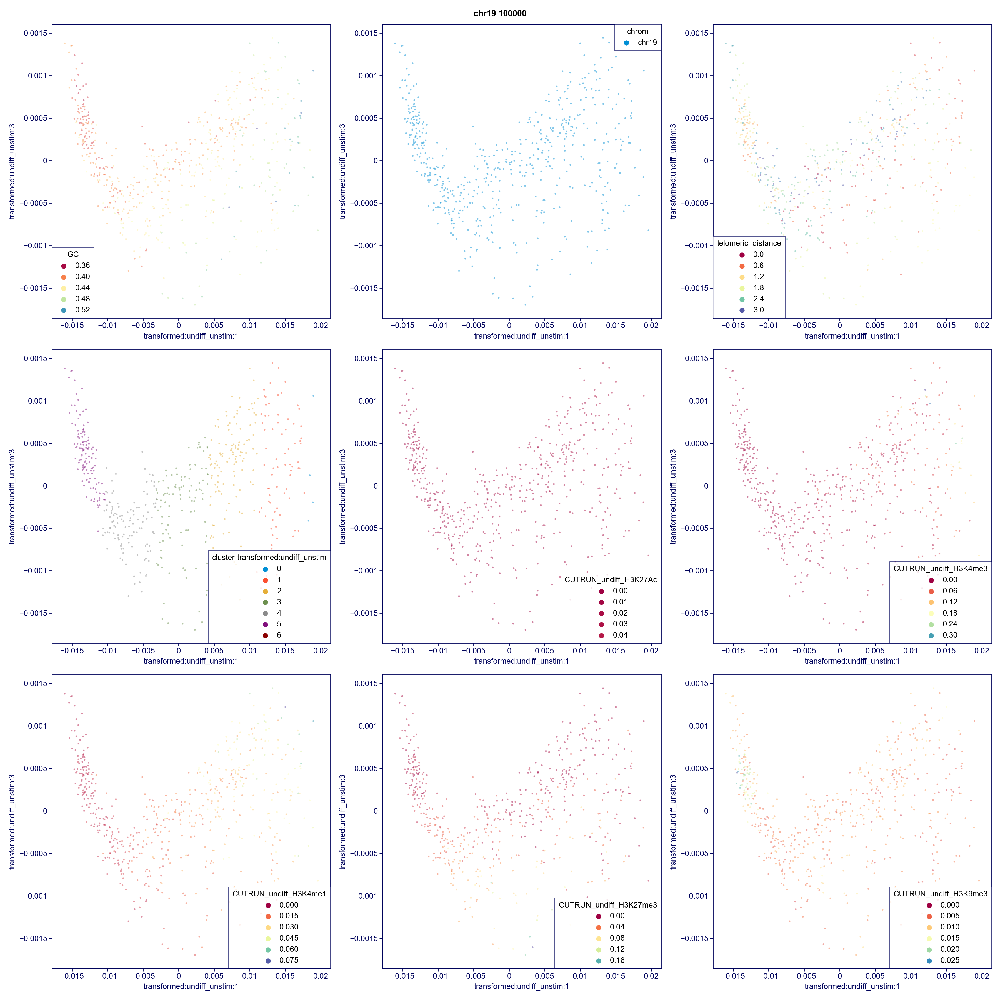

In [63]:
kwargs_cont = dict(
    palette='spectral',
    s=5,
    alpha=0.5,
)

kwargs_cont_marks = dict(kwargs_cont)
kwargs_cont_marks.update( {'hue_norm':mpl.colors.Normalize(vmin=1e-4, vmax=1)} )

kwargs_discrete = dict(
    s=5,
    palette=cmap.colors,
    alpha=0.5,
)

annotations = [
    ['GC', kwargs_cont],
    ['chrom', kwargs_discrete],
    ['telomeric_distance', kwargs_cont],
    ['cluster-transformed:undiff_unstim', kwargs_discrete],
    ['CUTRUN_undiff_H3K27Ac', kwargs_cont_marks],
    ['CUTRUN_undiff_H3K4me3', kwargs_cont],
    ['CUTRUN_undiff_H3K4me1', kwargs_cont],
    ['CUTRUN_undiff_H3K27me3', kwargs_cont],
    ['CUTRUN_undiff_H3K9me3', kwargs_cont],
]

x = 'transformed:undiff_unstim:1'
y = 'transformed:undiff_unstim:3'

nplots = len(annotations)
ncols = 3 
nrows = int(np.ceil(nplots/ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=[ncols*6, nrows*6])
axes = axes.flatten()

for i, annot in enumerate(annotations):
    col, kwargs = annot
    ax=axes[i]
    sns.scatterplot(
        x=x,
        y=y,
        data=bins_region,
        hue=col,
        ax=ax,
        **kwargs,
    )

fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/scatter.cluster-annotation.comp1-comp3.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/scatter.cluster-annotation.comp1-comp3.{CHROM}.{BINSIZE}.pdf")

### Visualize heatmaps

In [65]:
len(bins_region)

615

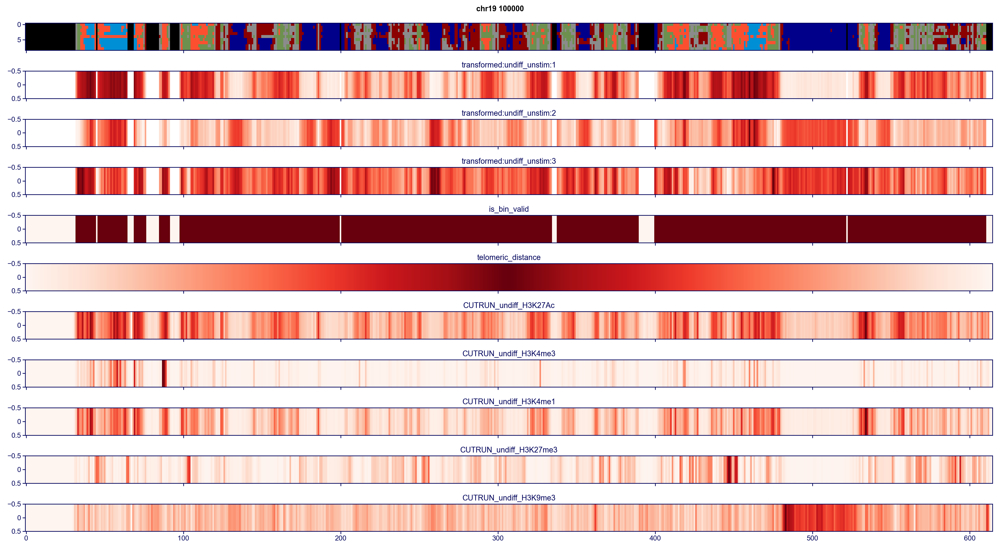

In [66]:
region_toplot = (0, len(bins_region))
cond = "undiff_unstim"
cols_toplot = [
    f'{mode}:{cond}:1',
    f'{mode}:{cond}:2',
    f'{mode}:{cond}:3',
    'is_bin_valid',
    'telomeric_distance',
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K27me3',
    'CUTRUN_undiff_H3K9me3',
]

nrows = len(cols_toplot)+1
fig, axes = plt.subplots(nrows, 1, figsize=[20, nrows*1], sharex=True)

ax = axes[0]
ax.imshow(bins_region.loc[region_toplot[0]:region_toplot[1], output_cols].astype(int).values.T, cmap=cmap, aspect='auto')

for ax, col in zip(axes[1:], cols_toplot):
    ax.imshow(bins_region.loc[region_toplot[0]:region_toplot[1], [col]].values.astype(np.float64).T, cmap='Reds', aspect='auto')
    ax.set_title(col)
    
fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.{CHROM}.{BINSIZE}.pdf")

In [74]:
len(bins_region)

2458

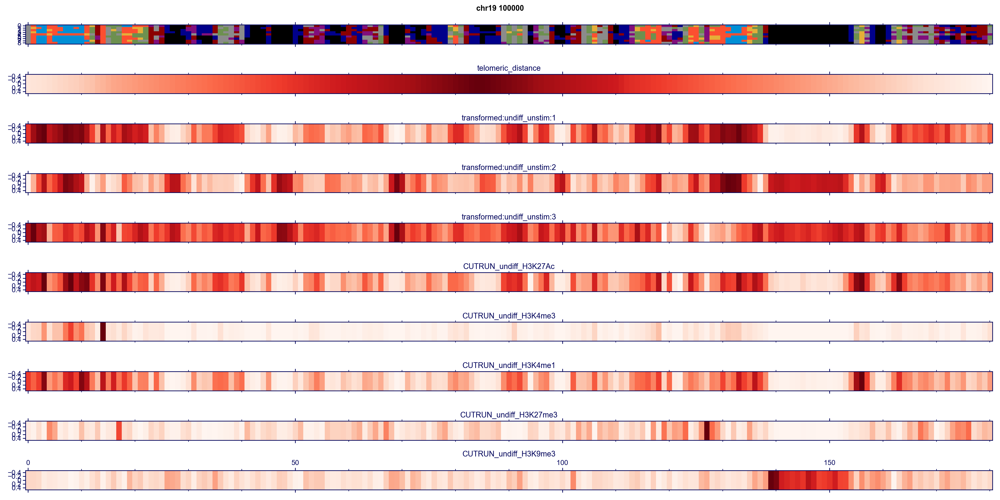

In [67]:
region_toplot = (0, len(bins_region))

idx_order = bins_region.loc[region_toplot[0]:region_toplot[1], :].query('is_bin_valid==True').index

cols_toplot = [
    'telomeric_distance',
    f'{mode}:{cond}:1',
    f'{mode}:{cond}:2',
    f'{mode}:{cond}:3',
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K27me3',
    'CUTRUN_undiff_H3K9me3',
]

nrows = len(cols_toplot)+1
fig, axes = plt.subplots(nrows, 1, figsize=[20, nrows*1], sharex=True)

ax = axes[0]
joint_lib.imshow_rasterized(bins_region.loc[idx_order, output_cols].astype(int).values.T, coarse_factor=3, cmap=cmap, ax=ax)

for ax, col in zip(axes[1:], cols_toplot):
    joint_lib.imshow_rasterized(bins_region.loc[idx_order, col].values.astype(np.float64).T, coarse_factor=3, cmap='Reds', ax=ax)
    ax.set_title(col)
    
fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.v1.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.v1.{CHROM}.{BINSIZE}.pdf")

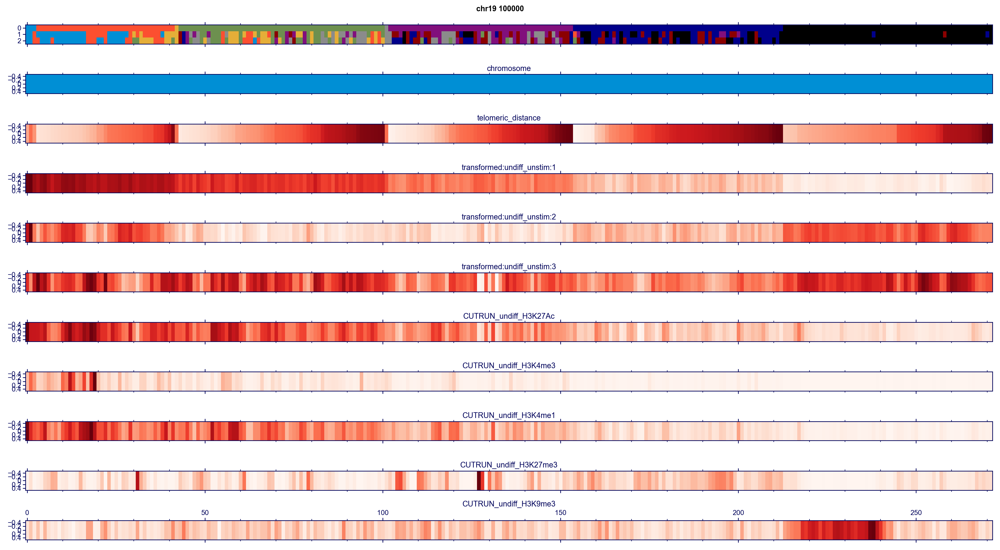

In [68]:
region_toplot = (0, 30894)

cond = 'undiff_unstim'
cols_clust = [
    f'cluster-{mode}:{cond}',
    f'cluster-{mode}:WT_cDC',
    f'cluster-{mode}:cDC_unstim',
]

idx_order = bins_region.loc[region_toplot[0]:region_toplot[1], :].query('is_bin_valid==True').sort_values([
 f'cluster-{mode}:{cond}',
 'telomeric_distance',
]).index

cols_toplot = [
    'telomeric_distance',
    f'{mode}:{cond}:1',
    f'{mode}:{cond}:2',
    f'{mode}:{cond}:3',
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K27me3',
    'CUTRUN_undiff_H3K9me3',
]

nrows = len(cols_toplot)+2
fig, axes = plt.subplots(nrows, 1, figsize=[20, nrows*1], sharex=True)

ax = axes[0]
joint_lib.imshow_rasterized(bins_region.loc[idx_order, cols_clust].astype(int).values.T, func=np.nanmedian, coarse_factor=2, cmap=cmap, ax=ax)

# chromosome annotation
ax = axes[1]
joint_lib.imshow_rasterized(pd.factorize(bins_region.loc[idx_order, 'chrom'])[0].T, func=np.nanmedian, coarse_factor=2, cmap=cmap, ax=ax)
ax.set_title("chromosome")

for ax, col in zip(axes[2:], cols_toplot):
    joint_lib.imshow_rasterized(bins_region.loc[idx_order, col].values.astype(np.float64).T, func=np.nanmean, coarse_factor=2, cmap='Reds', ax=ax)
    ax.set_title(col)
    
fig.suptitle(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.v3.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/heatmap_region.v3.{CHROM}.{BINSIZE}.pdf")

In [69]:
### Write the output:

if MODE.startswith("R"):
    pass 
elif MODE.startswith("W"):
    bins.to_csv(f'{OUTPUT_FOLDER}/output_table.{CHROM}.{BINSIZE}.csv')
else:
    raise Exception(f"MODE {MODE} is not implemented")

### Sankey diagrams

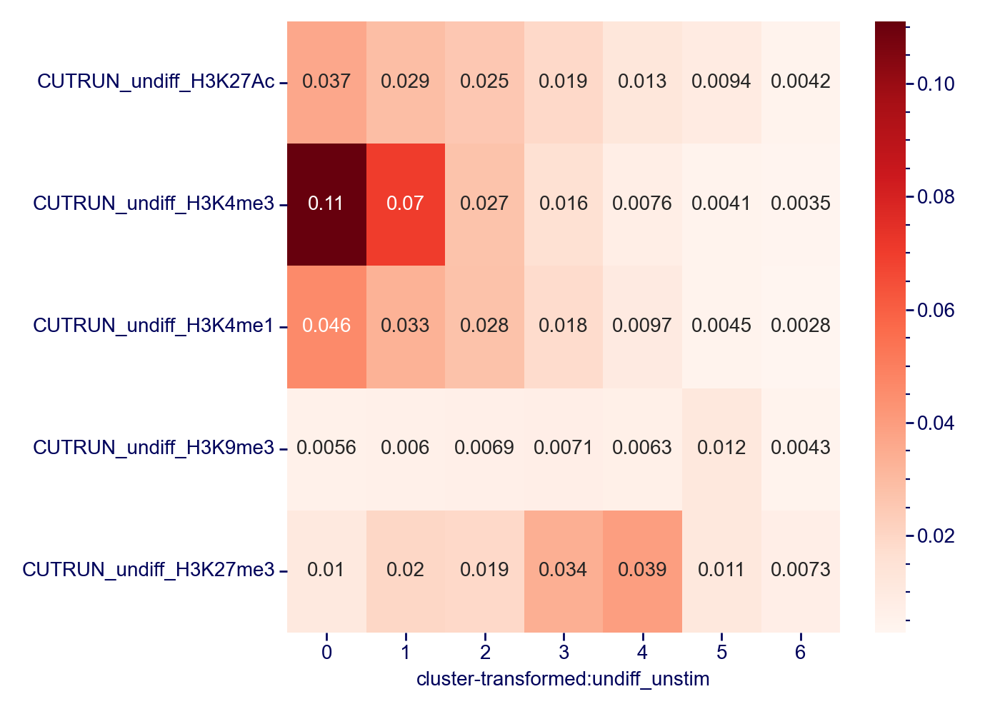

In [70]:
# Check re-ordering
cond = 'undiff_unstim'
col = f'cluster-{mode}:{cond}'
col_toplot = [
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K9me3',
    'CUTRUN_undiff_H3K27me3',
]

df_toplot = bins_region.groupby(col).mean()[col_toplot]
plt.figure(figsize=[7, 5])
sns.heatmap(df_toplot.sort_values(['CUTRUN_undiff_H3K27Ac', 'CUTRUN_undiff_H3K4me3'], ascending=False).T, cmap='Reds', annot=True)
plt.tight_layout()

In [71]:
list_cluster_reorder = [0, 0, 1, 2, 3, 4, 5]
n_clusters = 6

In [72]:
# Re-order the clusters:
bins_region.loc[:, output_cols] = bins_region.loc[:, output_cols].replace(np.arange(n_clusters+1), list_cluster_reorder).astype('category')

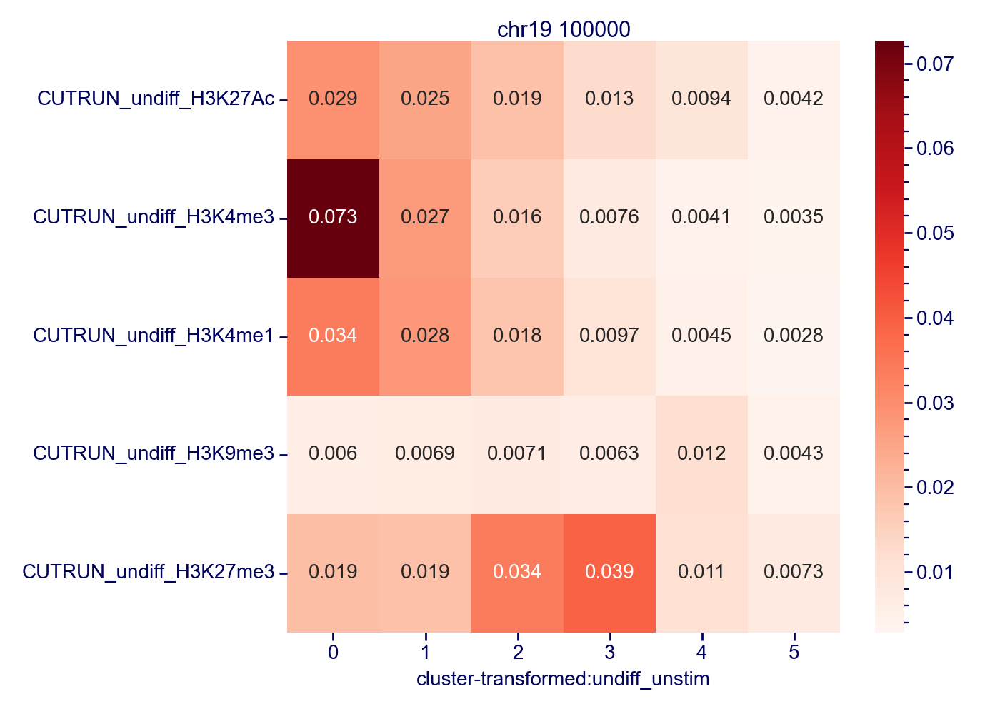

In [73]:
# Check re-ordering
cond = 'undiff_unstim'
col = f'cluster-{mode}:{cond}'
col_toplot = [
    'CUTRUN_undiff_H3K27Ac',
    'CUTRUN_undiff_H3K4me3',
    'CUTRUN_undiff_H3K4me1',
    'CUTRUN_undiff_H3K9me3',
    'CUTRUN_undiff_H3K27me3',
]

df_toplot = bins_region.groupby(col).mean()[col_toplot]
plt.figure(figsize=[7, 5])
sns.heatmap(df_toplot.sort_values(['CUTRUN_undiff_H3K27Ac', 'CUTRUN_undiff_H3K4me3'], ascending=False).T, cmap='Reds', annot=True)
plt.tight_layout()

plt.title(f"{CHROM} {BINSIZE}", y=0.99)
plt.tight_layout()

plt.savefig(f"{OUTPUT_FOLDER}/heatmap.clusters-annotation.reduced.{CHROM}.{BINSIZE}.png")
plt.savefig(f"{OUTPUT_FOLDER}/heatmap.clusters-annotation.reduced.{CHROM}.{BINSIZE}.pdf")

In [74]:
region, BINSIZE

('chr19', 100000)

In [75]:
def groups2sankey_multicolor(df, states, n_states, n_clusters, cmap):
    """ More advanced implementation of df_links that sorts the links by nodes appearance"""
    clusters_numbered = np.arange(n_clusters)
    colors_clusters = [ mpl.colors.rgb2hex(x) for x in cmap.colors[:n_clusters]]
    colors_clusters_alpha = [ "rgba("+",".join( [str(x) for x in ((*mpl.colors.hex2color( mpl.colors.rgb2hex(x) ), 0.2))] )+")" for x in cmap.colors[:n_clusters]]
    
    df_nodes = pd.DataFrame({
        'cluster': list(clusters_numbered) * n_states, 
        'color': list(colors_clusters) * n_states,
        'cond': np.repeat(conditions, n_clusters),
        'x' : np.repeat(range(n_states), n_clusters)*10
    })
    
    df_links = df.copy()

    for i in range(n_states):
        df_links.loc[:, "true" + cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int)
        df_links.loc[:, f"color {cols_states[i]}"] = [colors_clusters_alpha[i] for i in df_links.loc[:, cols_states[i]].astype(int).values ]
        df_links.loc[:, cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int) + i*(n_clusters)

    df_links.loc[:, 'color_left']  = df_links.apply(lambda x: x[f"color {cols_states[0]}"], axis=1)
    df_links.loc[:, 'color_right'] = df_links.apply(lambda x: x[f"color {cols_states[-1]}"], axis=1)

    dfs = []
    for state1, state2 in zip(cols_states[:-1], cols_states[1:]):
        df_tmp = df_links.loc[:, [state1, state2, 'nbins', 'color_left']+list( df_links.columns )]
        df_tmp.columns=['left', 'right', 'value', 'color']+list( df_links.columns )
        
        dfs.append(df_tmp.copy())

    df_links = pd.concat(dfs, axis=0).sort_values(["true" + state for state in cols_states])
    
    return df_nodes, df_links

def add_alpha(color, alpha):
    color = mpl.colors.hex2color(color)
    color = "rgba("+",".join( [str(x) for x in ((*color, alpha))] )+")"
    return color


def groups2sankey_binary_color(df, cols_states, n_states, n_clusters, cmap):
    """ More advanced implementation of df_links that sorts the links by nodes appearance"""
    clusters_numbered = np.arange(n_clusters)
    colors_clusters = [ mpl.colors.rgb2hex(x) for x in cmap.colors[:n_clusters]]
    colors_clusters_alpha = [ "rgba("+",".join( [str(x) for x in ((*mpl.colors.hex2color( mpl.colors.rgb2hex(x) ), 0.2))] )+")" for x in cmap.colors[:n_clusters]]
    
    df_nodes = pd.DataFrame({
        'cluster': list(clusters_numbered) * n_states, 
        'color': list(colors_clusters) * n_states,
        'cond': np.repeat(conditions, n_clusters),
        'x' : np.repeat(range(n_states), n_clusters)*10
    })
    
    df_links = df.copy()

    for i in range(n_states):
        df_links.loc[:, "true" + cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int)
        df_links.loc[:, f"color {cols_states[i]}"] = [colors_clusters_alpha[i] for i in df_links.loc[:, cols_states[i]].astype(int).values ]
        df_links.loc[:, cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int) + i*(n_clusters)

#     df_links.loc[:, 'color_left']  = df_links.apply(lambda x: x[f"color {cols_states[0]}"] if x["true" + cols_states[1]]!=x["true" + cols_states[2]] else add_alpha('gray', 0.2), axis=1)
#     df_links.loc[:, 'color_right'] = df_links.apply(lambda x: x[f"color {cols_states[2]}"] if x["true" + cols_states[1]]!=x["true" + cols_states[2]] else add_alpha('gray', 0.2), axis=1)

    df_links.loc[:, 'color_left']  = df_links.apply(lambda x: add_alpha('red', 0.2) if x["true" + cols_states[1]]!=x["true" + cols_states[-1]] else add_alpha('gray', 0.2), axis=1)
    df_links.loc[:, 'color_right'] = df_links.apply(lambda x: add_alpha('red', 0.2) if x["true" + cols_states[1]]!=x["true" + cols_states[-1]] else add_alpha('gray', 0.2), axis=1)

    dfs = []
    for state1, state2 in zip(cols_states[:-1], cols_states[1:]):
        df_tmp = df_links.loc[:, [state1, state2, 'nbins', 'color_left']+list( df_links.columns )]
        df_tmp.columns=['left', 'right', 'value', 'color']+list( df_links.columns )
        
        dfs.append(df_tmp.copy())

    df_links = pd.concat(dfs, axis=0).sort_values(["true" + state for state in cols_states])
    
    return df_nodes, df_links

In [76]:
CONDITIONS

['undiff_unstim',
 'cDC_unstim',
 'pDC_unstim',
 'pDC_CpGA',
 'IRF8KO',
 'SMC3KO_cDC',
 'SMC3KO_pDC',
 'WT_cDC',
 'WT_pDC']

#### Sankey pDC activation

In [77]:
title = "pDC_activation"
conditions = ['undiff_unstim', 'pDC_unstim', 'pDC_CpGA']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

df = bins_region.groupby(cols_states).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [78]:
df.query('nbins>0').set_index(cols_states)

nbins
cluster-transformed:undiff_unstim cluster-transformed:pDC_unstim cluster-transformed:pDC_CpGA       
0                                 0                              0                                78
                                                                 1                                 4
                                  1                              0                                 1
                                                                 1                                 2
1                                 0                              0                                18
                                                                 1                                 4
                                  1                              0                                 5
                                                                 1                                63
                                                                 2                                 6
                                  2                              1                                 3
                                                                 2                                18
                                                                 3                                 1
2                                 1                              1                                10
                                                                 2                                 2
                                  2                              1                                 3
                                                                 2                                59
                                                                 3                                 3
                                  3                              2                                 6
                                                                 3                                22
3                                 1                              1                                 4
                                  2                              1                                 3
                                                                 2                                 8
                                                                 3                                 3
                                  3                              3                                77
                                                                 4                                 3
                                  4                              3                                 3
                                                                 4                                17
4                                 3                              3                                 5
                                                                 4                                 3
                                  4                              3                                 1
                                                                 4                               110

In [79]:
df_nodes, df_links = groups2sankey_multicolor(df, cols_states, n_states, n_clusters, cmap)

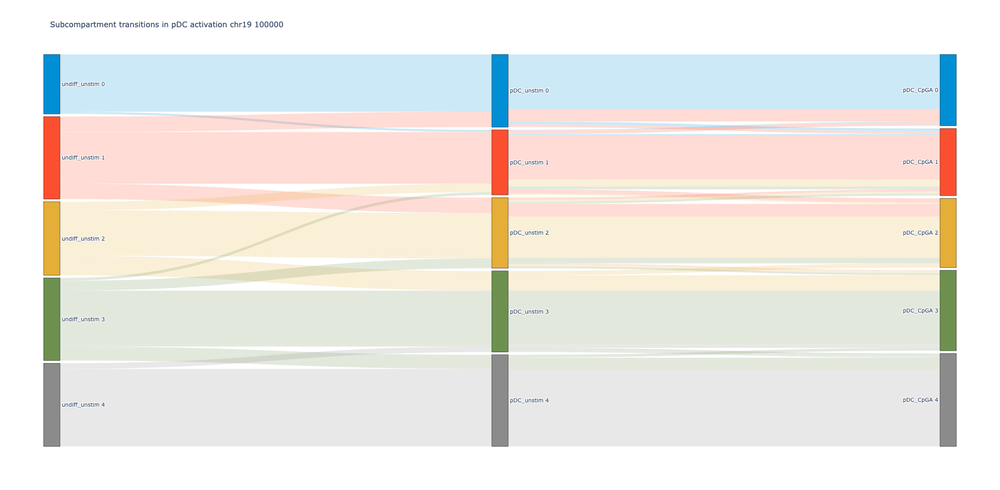

In [80]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.multicolor.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.multicolor.png")

In [ ]:
df_nodes, df_links = groups2sankey_binary_color(df, cols_states, n_states, n_clusters, cmap)

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.binary.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.binary.png")

#### Sankey cDC and IRF8KO

In [114]:
title = "IRF8KO"
conditions = ['undiff_unstim', 'cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

df = bins_region.groupby(cols_states).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [115]:
df.query('nbins>0').set_index(cols_states)

nbins
cluster-transformed:undiff_unstim cluster-transformed:cDC_unstim cluster-transformed:IRF8KO       
0                                 0                              0                              70
                                                                 1                               2
                                  1                              0                               8
                                                                 1                               5
1                                 0                              0                              15
                                                                 1                              18
                                  1                              0                               4
                                                                 1                              45
                                                                 2                               6
                                  2                              1                               3
                                                                 2                              21
                                                                 3                               1
                                  3                              2                               2
                                                                 3                               3
2                                 1                              1                               6
                                                                 2                              13
                                  2                              1                               3
                                                                 2                              43
                                                                 3                               5
                                  3                              2                               5
                                                                 3                              29
                                  4                              3                               1
3                                 1                              2                               2
                                  2                              2                               7
                                                                 3                              11
                                  3                              2                               7
                                                                 3                              67
                                                                 4                               1
                                  4                              3                              16
                                                                 4                               7
4                                 3                              3                               6
                                  4                              3                              13
                                                                 4                             100

In [116]:
df_nodes, df_links = groups2sankey_multicolor(df, cols_states, n_states, n_clusters, cmap)

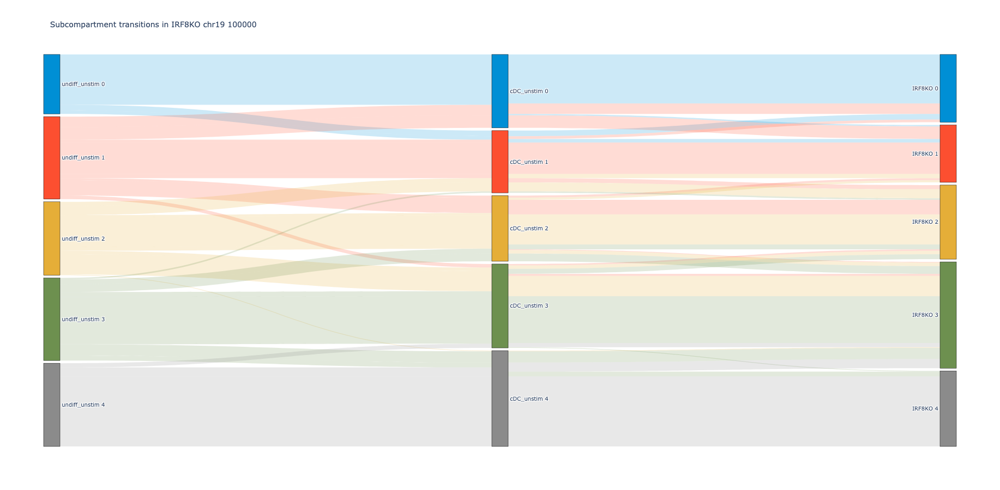

In [117]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.multicolor.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.multicolor.png")


In [118]:
df_nodes, df_links = groups2sankey_binary_color(df, cols_states, n_states, n_clusters, cmap)

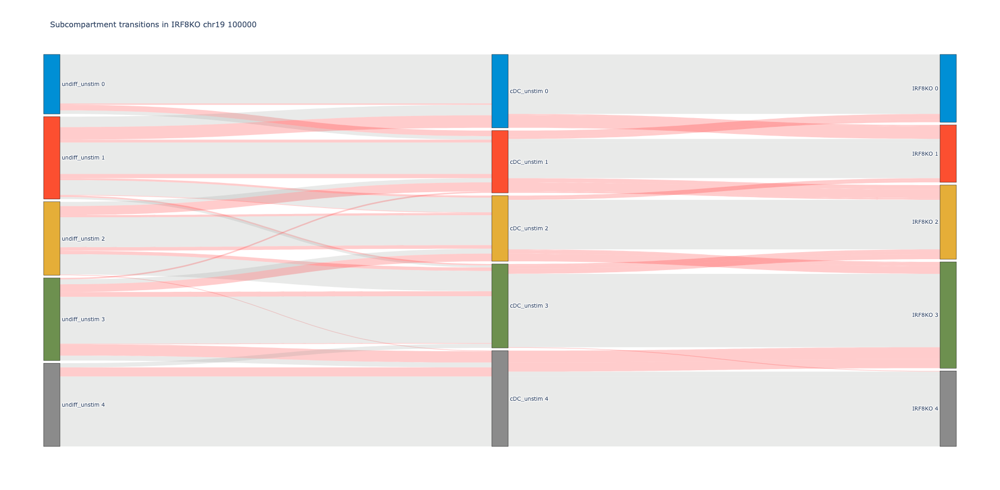

In [119]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.binary.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.binary.png")

#### Sankey cDC and SMC3KO

In [120]:
title = "SMC3KO_2_state"
conditions = ['WT_cDC', 'SMC3KO_cDC'] # 'undiff_unstim', 'cDC_unstim', 
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 2
n_clusters = 6

df = bins_region.groupby(cols_states).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [121]:
df.query('nbins>0').set_index(cols_states)

nbins
cluster-transformed:WT_cDC cluster-transformed:SMC3KO_cDC       
0                          0                                  99
                           1                                  12
1                          0                                   3
                           1                                  66
                           2                                   1
2                          1                                  14
                           2                                  93
                           3                                   3
3                          2                                   9
                           3                                 106
                           4                                   4
4                          3                                   4
                           4                                 131

In [122]:
df_nodes, df_links = groups2sankey_multicolor(df, cols_states, n_states, n_clusters, cmap)

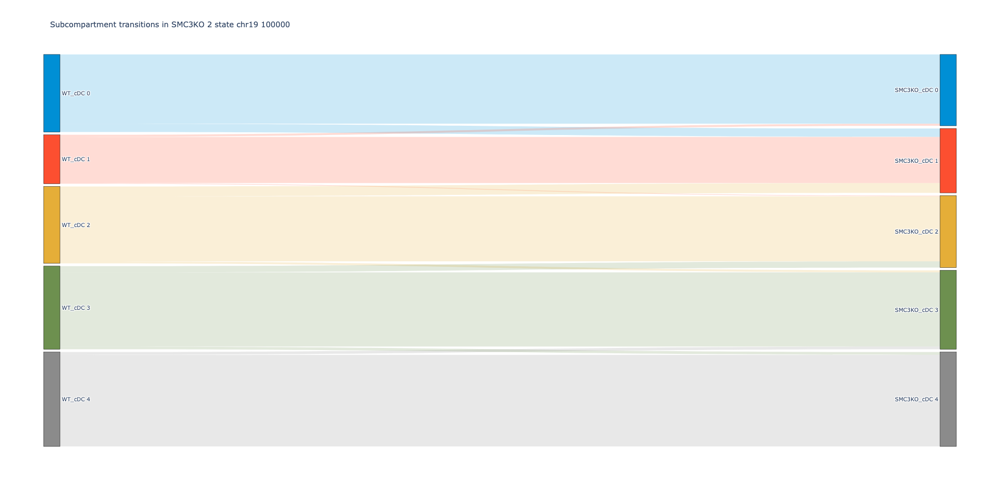

In [123]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.png")

In [124]:
title = "SMC3KO_4_state"
conditions = ['undiff_unstim', 'cDC_unstim', 'WT_cDC', 'SMC3KO_cDC']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 4
n_clusters = 6

df = bins_region.groupby(cols_states).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [125]:
df.query('nbins>0').set_index(cols_states)

nbins
cluster-transformed:undiff_unstim cluster-transformed:cDC_unstim cluster-transformed:WT_cDC cluster-transformed:SMC3KO_cDC       
0                                 0                              0                          0                                  70
                                                                                            1                                   2
                                  1                              0                          0                                   6
                                                                                            1                                   1
                                                                 1                          0                                   1
                                                                                            1                                   5
1                                 0                              0                          0                                  19
                                                                                            1                                   6
                                                                 1                          0                                   2
                                                                                            1                                   6
                                  1                              0                          0                                   3
                                                                                            1                                   1
                                                                 1                          1                                  41
                                                                 2                          1                                   7
                                                                                            2                                   3
                                  2                              1                          1                                   3
                                                                 2                          2                                  19
                                                                                            3                                   1
                                                                 3                          2                                   1
                                                                                            3                                   1
                                  3                              3                          3                                   5
2                                 1                              1                          1                                   9
                                                                 2                          1                                   5
                                                                                            2                                   5
                                  2                              0                          1                                   1
                                                                 1                          1                                   2
                                                                                            2                                   1
                                                                 2                          2                                  40
                                                                 3                          2                                   2
                                                                                            3 

In [126]:
df_nodes, df_links = groups2sankey_multicolor(df, cols_states, n_states, n_clusters, cmap)

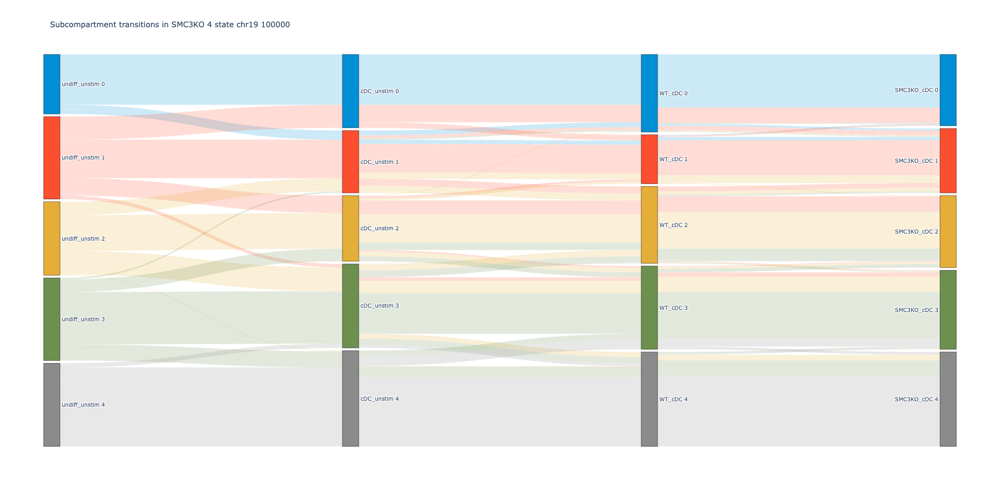

In [127]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))])

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700)
fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.{CHROM}.{BINSIZE}.{title}.png")

### Sankey colored by omics changes

#### Load additional omics datasets

In [128]:
import bioframe
from bioframe.sandbox import gtf_io

df_genes = bioframe.read_table("/home/agalicina/IMMUNE/data/mm10.refGene.gtf", schema="gtf")
attributes = gtf_io.parse_gtf_attributes(df_genes.attributes, kv_sep=" ", item_sep=";", quotechar='"')

df_genes = pd.concat([df_genes, attributes], axis=1)

del attributes

In [129]:
df_genes = df_genes.query("feature=='CDS'")
df_genes = df_genes.drop_duplicates(subset=["gene_id"])

In [130]:
## Note that the DE analysis is outdated here:
df_expression = pd.read_csv(
    '/home/agalicina/IMMUNE/data/RNA_genewise_datasets_combined.csv', 
    sep='\t', index_col=0)

In [131]:
df_merged = pd.merge(df_genes, df_expression, left_on="gene_id", right_on="gene", how='outer')

In [132]:
df_expression = df_merged.dropna(subset=['chrom', 'start', 'end'])
df_expression.loc[:, 'start_ncbi'] = df_expression.start.astype(int)
df_expression.loc[:, 'end_ncbi'] = df_expression.end.astype(int)

df_expression.loc[:, 'start'] = df_expression.start_ncbi
df_expression.loc[df_expression.strand=="-", 'start'] = df_expression.loc[df_expression.strand=="-", 'end_ncbi']
df_expression.loc[:, 'end'] = df_expression.start_ncbi+1
df_expression.loc[df_expression.strand=="-", 'end'] = df_expression.loc[df_expression.strand=="-", 'end_ncbi']+1

In [133]:
chroms = ['chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15',
       'chr16', 'chr17', 'chr18', 'chr19', 'chr2', 'chr3', 'chr4', 'chr5',
       'chr6', 'chr7', 'chr8', 'chr9', 'chrX']
df_expression = df_expression.query(f'chrom in {chroms}')
df_expression = df_expression.reset_index(drop=False)

In [134]:
df_expr_annot = bioframe.overlap(df_expression.set_index('index'), bins, how='left')

In [135]:
df_expr_annot = df_expr_annot.drop([x for x in df_expr_annot.columns if 'DE' in x], axis=1)

In [219]:
dfs = {}
dfs['DC1_WT_unstim-stim'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC1_WT_unstim-stim.tsv')
dfs['DC1_KO_unstim-stim'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC1_KO_unstim-stim.tsv')

dfs['DC2_WT_unstim-stim'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC2_WT_unstim-stim.tsv')
dfs['DC2_KO_unstim-stim'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC2_KO_unstim-stim.tsv')

dfs['DC2_WT-KO'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC2_WT-KO.tsv')
dfs['DC1_WT-KO'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC1_WT-KO.tsv')

dfs['DC2_stim_WT-KO'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC2_stim_WT-KO.tsv')
dfs['DC1_stim_WT-KO'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_DC1_stim_WT-KO.tsv')

# Read comparison between differentiation in HoxB8 and mutants in bone marrow: 
dfs['undiff-cDC_WT_HoxB'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/undiff-cDC_WT_HoxB.tsv')

dfs['cDC-cDC2_WT_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/cDC-cDC2_WT_HoxB-BM.tsv')
dfs['cDC-cDC1_WT_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/cDC-cDC1_WT_HoxB-BM.tsv')

dfs['undiff-cDC2_WT_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/undiff-cDC2_WT_HoxB-BM.tsv')
dfs['undiff-cDC1_WT_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/undiff-cDC1_WT_HoxB-BM.tsv')

dfs['undiff-cDC2_WT-KO_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/undiff-cDC2_WT-KO_HoxB-BM.tsv')
dfs['undiff-cDC1_WT-KO_HoxB-BM'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/undiff-cDC1_WT-KO_HoxB-BM.tsv')

# Read comparison of Irf8KO and WT:
dfs['Irf8KO_WT-KO'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_IRF8KO.tsv')

# Read comparison of pDC and pDC_CpGA:
dfs['pDC_unstim-stim'] = pd.read_table('/home/agalicina/IMMUNE/data/DE/DE_WT_unstim-vs-18h.tsv')

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [220]:
df = pd.DataFrame(columns=['gene'])
for k in ['DC1_WT_unstim-stim', 'DC1_KO_unstim-stim', 
          'DC2_WT_unstim-stim', 'DC2_KO_unstim-stim', 
          'DC1_WT-KO', 'DC2_WT-KO', 
          'DC1_stim_WT-KO', 'DC2_stim_WT-KO',
          'undiff-cDC_WT_HoxB', 'cDC-cDC2_WT_HoxB-BM', 
          'cDC-cDC1_WT_HoxB-BM', 'undiff-cDC2_WT_HoxB-BM', 
          'undiff-cDC1_WT_HoxB-BM', 'undiff-cDC2_WT-KO_HoxB-BM', 
          'undiff-cDC1_WT-KO_HoxB-BM', 'Irf8KO_WT-KO', 'pDC_unstim-stim']:
    df_tmp = dfs[k].copy()
    df_tmp.columns = [x+"_"+k for x in df_tmp.columns]
    df_tmp.index.name = "gene"
    df_tmp = df_tmp.reset_index()
    df = pd.merge(df, df_tmp, on="gene", how="outer")

In [221]:
df_DE = pd.merge(df, df_expr_annot, left_on="gene", right_on="gene_id", how="outer")
df_DE = df_DE.query(f"chrom=='{region}'")

In [222]:
k = 'pDC_unstim-stim' #'Irf8KO_WT-KO'
df_DE.loc[:, f"-log10Pv {k}"] = -np.log10(df_DE[f'PValue_{k}'])

th_pv = 0.05
th_fc = 1.5

is_up = (df_DE[f'PValue_{k}']<th_pv) & (df_DE[f'logFC_{k}']>th_fc)
is_down = (df_DE[f'PValue_{k}']<th_pv) & (df_DE[f'logFC_{k}']<-th_fc)

df_DE.loc[:, f"isDE {k}"] = "unchanged"
df_DE.loc[is_up, f"isDE {k}"] = 'up'
df_DE.loc[is_down, f"isDE {k}"] = 'down'

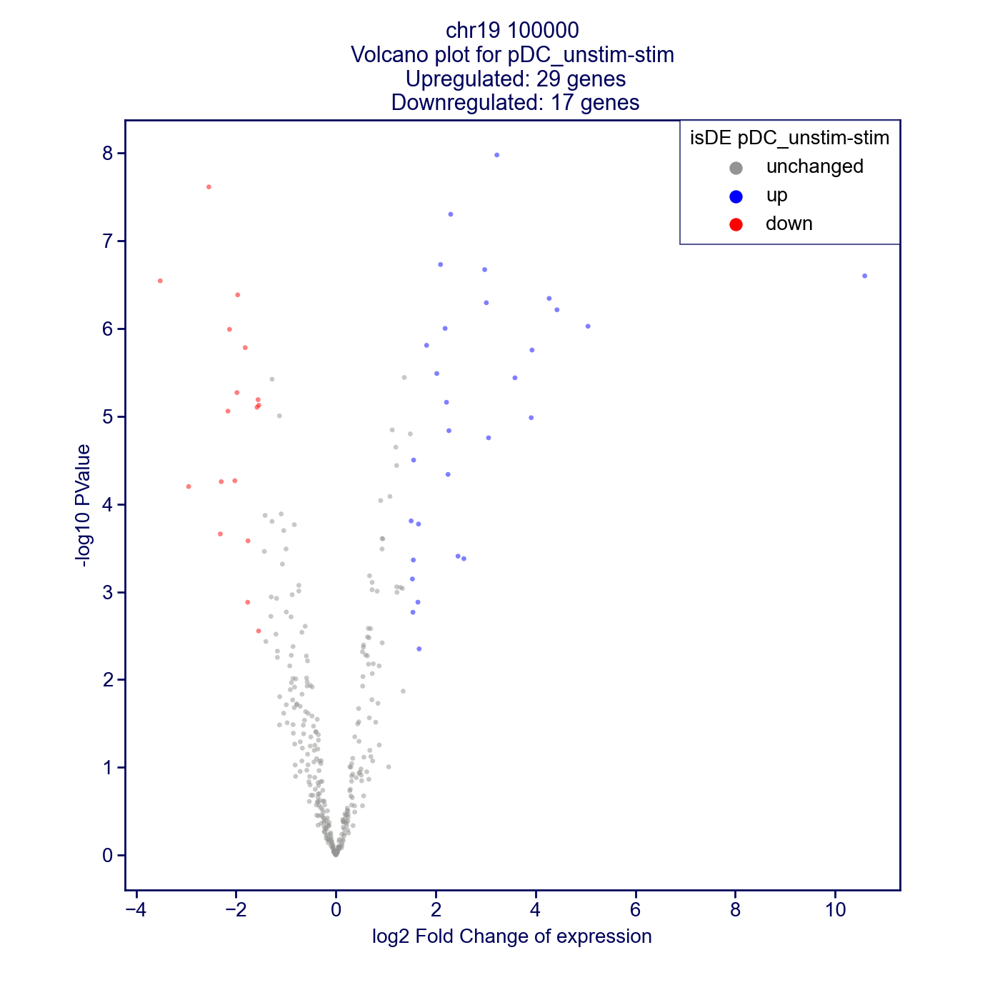

In [140]:
plt.figure(figsize=[7, 7])
sns.scatterplot(data=df_DE, x=f'logFC_{k}', y=f"-log10Pv {k}", hue=f"isDE {k}", s=6, linewidth=0, alpha=0.5, palette={'up':'blue', 'down':'red', 'unchanged':'gray'})

ifn_list = [x for x in df_DE['gene'].values if 'ifn' in str(x).lower()]
sns.scatterplot(data=df_DE.query(f'gene in {ifn_list}'), x=f'logFC_{k}', y=f"-log10Pv {k}", s=10, linewidth=0, alpha=1, color='black')

for i, r in df_DE.query(f'gene in {ifn_list}').iterrows():
    plt.text(x=r[f'logFC_{k}'], y=r[f"-log10Pv {k}"], s=r['gene'], fontsize=8)
    
plt.xlabel("log2 Fold Change of expression")
plt.ylabel("-log10 PValue")


title = f"{CHROM} {BINSIZE}\nVolcano plot for {k}\n Upregulated: {np.sum(is_up)} genes\n Downregulated: {np.sum(is_down)} genes"
plt.title(title)

plt.savefig(f"{OUTPUT_FOLDER}/volcano_{k}.{CHROM}.{BINSIZE}.pdf")
plt.savefig(f"{OUTPUT_FOLDER}/volcano_{k}.{CHROM}.{BINSIZE}.png")

In [223]:
k = 'Irf8KO_WT-KO'
df_DE.loc[:, f"-log10Pv {k}"] = -np.log10(df_DE[f'PValue_{k}'])

th_pv = 0.05
th_fc = 1.5

is_up = (df_DE[f'PValue_{k}']<th_pv) & (df_DE[f'logFC_{k}']>th_fc)
is_down = (df_DE[f'PValue_{k}']<th_pv) & (df_DE[f'logFC_{k}']<-th_fc)

df_DE.loc[:, f"isDE {k}"] = "unchanged"
df_DE.loc[is_up, f"isDE {k}"] = 'up'
df_DE.loc[is_down, f"isDE {k}"] = 'down'

In [232]:
ifn_list = [x for x in df_DE['gene'].values if 'ifn' in str(x).lower()]
df_DE.query(f'gene in {ifn_list}').groupby([f"isDE {k}", 'chrom']).count()[['gene']].sort_values([f"isDE {k}", 'gene'])

gene
isDE Irf8KO_WT-KO chrom      
unchanged         chr10     2
                  chr7      2
                  chr16     3
                  chr4     14

In [ ]:
df_DE.groupby([f"isDE {k}", 'chrom']).count()[['gene']].sort_values([f"isDE {k}", 'gene'])

gene
isDE Irf8KO_WT-KO chrom      
down              chrX     10
                  chr18    14
                  chr12    18
                  chr16    21
                  chr19    21
                  chr14    23
                  chr13    26
                  chr15    30
                  chr10    31
                  chr3     31
                  chr8     32
                  chr4     33
                  chr17    36
                  chr5     37
                  chr6     39
                  chr9     41
                  chr7     48
                  chr2     49
                  chr1     58
                  chr11    71
unchanged         chr18   241
                  chr16   326
                  chr14   329
                  chrX    332
                  chr12   337
                  chr19   367
                  chr13   384
                  chr15   386
                  chr3    472
                  chr6    472
                  chr10   482
                  chr17   513
                  chr8    555
                  chr9    556
                  chr1    569
                  chr4    632
                  chr5    639
                  chr7    751
                  chr2    781
                  chr11   814
up                chr18    16
                  chrX     20
                  chr16    23
                  chr19    23
                  chr14    26
                  chr12    29
                  chr15    30
                  chr13    34
                  chr9     36
                  chr10    39
                  chr17    40
                  chr5     44
                  chr3     46
                  chr8     46
                  chr4     48
                  chr6     50
                  chr1     52
                  chr7     52
                  chr11    73
                  chr2     74

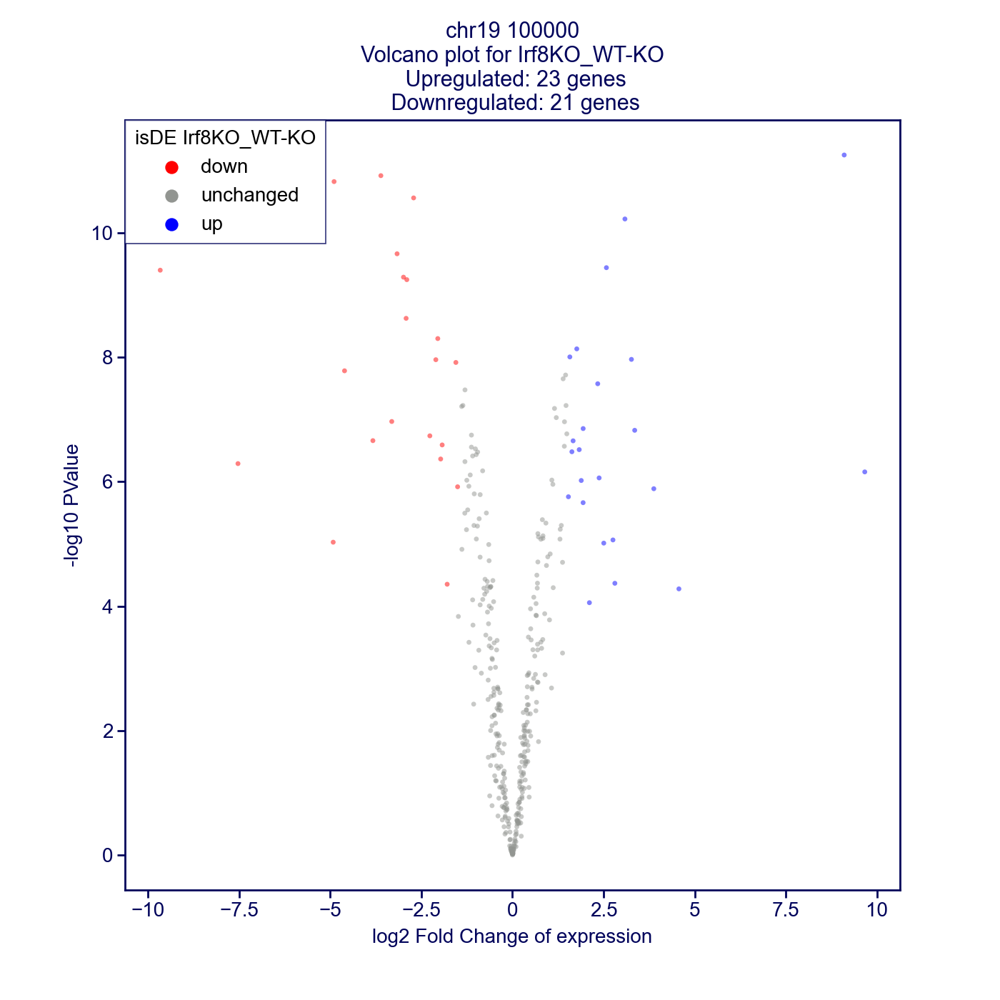

In [142]:
plt.figure(figsize=[7, 7])
sns.scatterplot(data=df_DE, x=f'logFC_{k}', y=f"-log10Pv {k}", hue=f"isDE {k}", s=6, linewidth=0, alpha=0.5, palette={'up':'blue', 'down':'red', 'unchanged':'gray'})

ifn_list = [x for x in df_DE['gene'].values if 'ifn' in str(x).lower()]
sns.scatterplot(data=df_DE.query(f'gene in {ifn_list}'), x=f'logFC_{k}', y=f"-log10Pv {k}", s=10, linewidth=0, alpha=1, color='black')

for i, r in df_DE.query(f'gene in {ifn_list}').iterrows():
    plt.text(x=r[f'logFC_{k}'], y=r[f"-log10Pv {k}"], s=r['gene'], fontsize=8)
    
plt.xlabel("log2 Fold Change of expression")
plt.ylabel("-log10 PValue")


title = f"{CHROM} {BINSIZE}\nVolcano plot for {k}\n Upregulated: {np.sum(is_up)} genes\n Downregulated: {np.sum(is_down)} genes"
plt.title(title)


plt.savefig(f"{OUTPUT_FOLDER}/volcano_{k}.{CHROM}.{BINSIZE}.pdf")
plt.savefig(f"{OUTPUT_FOLDER}/volcano_{k}.{CHROM}.{BINSIZE}.png")

#### Plot sankeys: pDC activation

In [161]:
k = 'pDC_unstim-stim'
def get_gene_state(x, k=k):
    if np.all(x[f"isDE {k}"] == "unchanged"): # All unchanged
        return "unchanged"
    elif np.any(x[f"isDE {k}"] == "up") & np.logical_not(np.any(x[f"isDE {k}"] == "down")): # At least one up and none down
        return "up"
    elif np.any(x[f"isDE {k}"] == "down") & np.logical_not(np.any(x[f"isDE {k}"] == "up")): # At least one down and none up
        return "down"
    else:
        return "unavailable"
    
# def get_gene_state(x, k=k):
#     if np.all(x[f"isDE {k}"] == "unchanged"): # All unchanged
#         return "unchanged"
#     elif np.sum(x[f"isDE {k}"] == "up") > np.sum(x[f"isDE {k}"] == "down"): # At least one up and none down
#         return "up"
#     elif np.sum(x[f"isDE {k}"] == "up") < np.sum(x[f"isDE {k}"] == "down"): # At least one down and none up
#         return "down"
#     else:
#         return "unknown"
    
df_bin_state = df_DE.groupby(['chrom_', 'start_', 'end_']).apply(get_gene_state).reset_index()

In [162]:
df_bin_state.columns = ['chrom', 'start', 'end', 'bin_state']

bins_region = bins_region.drop([x for x in bins_region.columns if 'bin_state' in x], axis=1)

bins_region = pd.merge(bins_region, df_bin_state, on=['chrom', 'start', 'end'], how='left')
bins_region.loc[:, 'bin_state'] = bins_region.loc[:, 'bin_state'].fillna("unavailable")

In [163]:
bins_region.groupby('bin_state').count()[['chrom']]

,chrom
bin_state,
down,15
unavailable,311
unchanged,267
up,22


In [164]:
title = "pDC_activation"
conditions = ['undiff_unstim', 'pDC_unstim', 'pDC_CpGA']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

In [165]:
df = bins_region.groupby(cols_states+['bin_state']).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [166]:
df.query('nbins>0').query('bin_state=="up" or bin_state=="down"')

,cluster-transformed:undiff_unstim,cluster-transformed:pDC_unstim,cluster-transformed:pDC_CpGA,bin_state,nbins
0,0,0,0,down,7
3,0,0,0,up,3
28,0,1,1,down,1
147,1,0,0,up,3
148,1,0,1,down,1
168,1,1,0,down,1
171,1,1,0,up,1
172,1,1,1,down,3
175,1,1,1,up,6
176,1,1,2,down,1


In [167]:
def add_alpha(color, alpha):
    color = mpl.colors.hex2color(color)
    color = "rgba("+",".join( [str(x) for x in ((*color, alpha))] )+")"
    return color


def groups2sankey_extcolor(df, key, cols_states, n_states, n_clusters, dict_colors):
    """ More advanced implementation of df_links that sorts the links by nodes appearance"""
    clusters_numbered = np.arange(n_clusters)
    colors_clusters = [ mpl.colors.rgb2hex(x) for x in cmap.colors[:n_clusters]]
    
    df_nodes = pd.DataFrame({
        'cluster': list(clusters_numbered) * n_states, 
        'color': list(colors_clusters) * n_states,
        'cond': np.repeat(conditions, n_clusters),
        'x' : np.repeat(range(n_states), n_clusters)*10
    })
    
    df_links = df.copy()

    for i in range(n_states):
        df_links.loc[:, "true" + cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int)
        df_links.loc[:, cols_states[i]] = df_links.loc[:, cols_states[i]].astype(int) + i*(n_clusters)

    df_links.loc[:, 'color_left']  = df_links.apply(lambda x: add_alpha(dict_colors[x[key]], 0.2), axis=1)
    df_links.loc[:, 'color_right'] = df_links.apply(lambda x: add_alpha(dict_colors[x[key]], 0.2), axis=1)

    dfs = []
    for state1, state2 in zip(cols_states[:-1], cols_states[1:]):
        df_tmp = df_links.loc[:, [state1, state2, 'nbins', 'color_left']+list( df_links.columns )]
        df_tmp.columns=['left', 'right', 'value', 'color']+list( df_links.columns )
        
        dfs.append(df_tmp.copy())

    df_links = pd.concat(dfs, axis=0).sort_values(["true" + state for state in cols_states])
    
    return df_nodes, df_links

In [168]:
dict_colors = {'down':'blue', 'unchanged':'darkgray', 'unavailable':'lightgray', 'up': 'red'}

In [169]:
df_nodes, df_links = groups2sankey_extcolor(df, 'bin_state', cols_states, n_states, n_clusters, dict_colors)

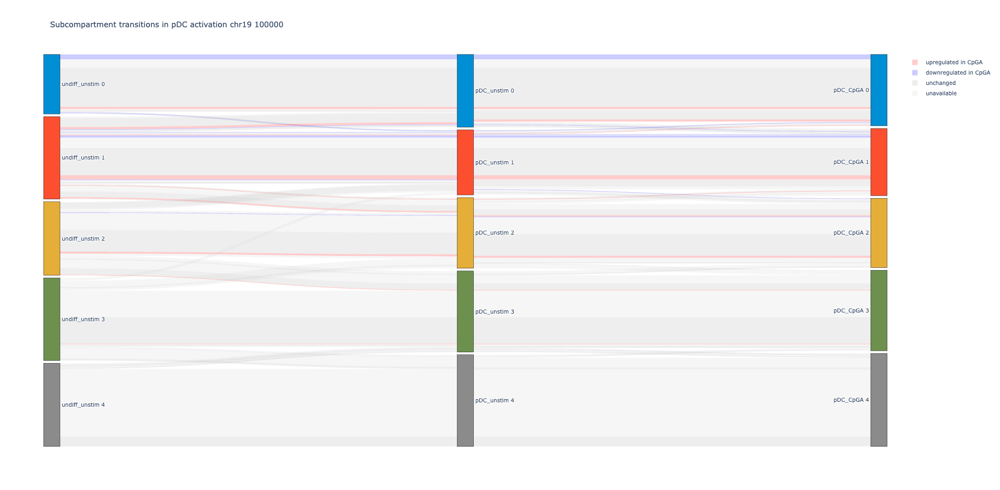

In [170]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [
    [add_alpha("red", 0.2), "upregulated in CpGA"],
    [add_alpha("blue", 0.2), "downregulated in CpGA"],
    [add_alpha("darkgray", 0.2), "unchanged"],
    [add_alpha("lightgray", 0.2), "unavailable"],
]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.DE_pDC.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.DE_pDC.{CHROM}.{BINSIZE}.{title}.png")

#### Plot sankeys: Irf8KO

In [171]:
k = 'Irf8KO_WT-KO'
def get_gene_state(x, k=k):
    if np.all(x[f"isDE {k}"] == "unchanged"): # All unchanged
        return "unchanged"
    elif np.any(x[f"isDE {k}"] == "up") & np.logical_not(np.any(x[f"isDE {k}"] == "down")): # At least one up and none down
        return "up"
    elif np.any(x[f"isDE {k}"] == "down") & np.logical_not(np.any(x[f"isDE {k}"] == "up")): # At least one down and none up
        return "down"
    else:
        return "unavailable"
    
# def get_gene_state(x, k=k):
#     if np.all(x[f"isDE {k}"] == "unchanged"): # All unchanged
#         return "unchanged"
#     elif np.sum(x[f"isDE {k}"] == "up") > np.sum(x[f"isDE {k}"] == "down"): # At least one up and none down
#         return "up"
#     elif np.sum(x[f"isDE {k}"] == "up") < np.sum(x[f"isDE {k}"] == "down"): # At least one down and none up
#         return "down"
#     else:
#         return "unknown"
    
df_bin_state = df_DE.groupby(['chrom_', 'start_', 'end_']).apply(get_gene_state).reset_index()

In [172]:
df_bin_state.columns = ['chrom', 'start', 'end', 'bin_state']

bins_region = bins_region.drop([x for x in bins_region.columns if 'bin_state' in x], axis=1)

bins_region = pd.merge(bins_region, df_bin_state, on=['chrom', 'start', 'end'], how='left')
bins_region.loc[:, 'bin_state'] = bins_region.loc[:, 'bin_state'].fillna("unavailable")

In [173]:
bins_region.groupby('bin_state').count()[['chrom']]

,chrom
bin_state,
down,19
unavailable,311
unchanged,263
up,22


In [174]:
title = "IRF8KO"
conditions = ['undiff_unstim', 'cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

In [175]:
df = bins_region.groupby(cols_states+['bin_state']).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [176]:
df.query('nbins>0').query('bin_state=="up" or bin_state=="down"')

,cluster-transformed:undiff_unstim,cluster-transformed:cDC_unstim,cluster-transformed:IRF8KO,bin_state,nbins
0,0,0,0,down,7
3,0,0,0,up,5
7,0,0,1,up,1
31,0,1,1,up,2
144,1,0,0,down,3
147,1,0,0,up,1
148,1,0,1,down,5
151,1,0,1,up,1
175,1,1,1,up,1
199,1,2,1,up,1


In [177]:
dict_colors = {'down':'red', 'unchanged':'darkgray', 'unavailable':'lightgray', 'up': 'blue'}

In [178]:
df_nodes, df_links = groups2sankey_extcolor(df, 'bin_state', cols_states, n_states, n_clusters, dict_colors)

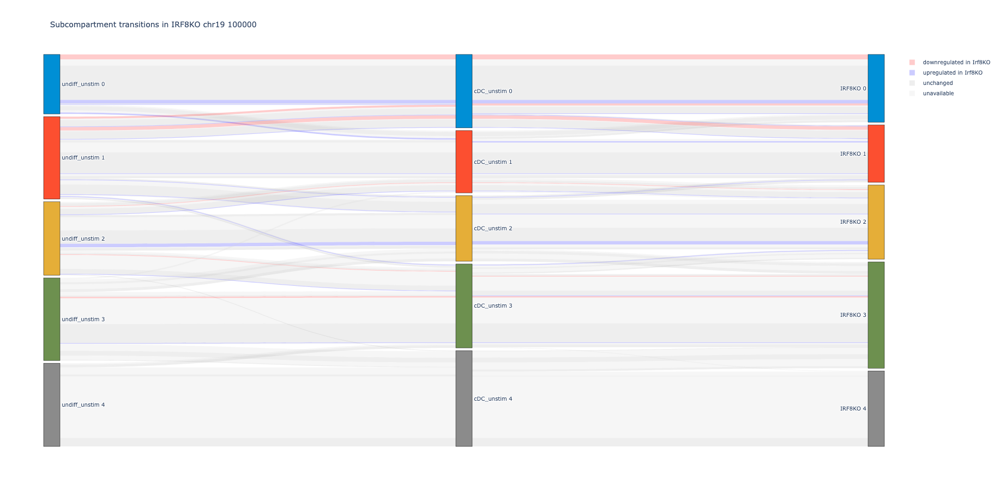

In [179]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [
    [add_alpha("red", 0.2), "downregulated in Irf8KO"],
    [add_alpha("blue", 0.2), "upregulated in Irf8KO"],
    [add_alpha("darkgray", 0.2), "unchanged"],
    [add_alpha("lightgray", 0.2), "unavailable"],
]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.DE_Irf8KO.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.DE_Irf8KO.{CHROM}.{BINSIZE}.{title}.png")

#### Plot sankeys: Irf8KO binding

In [180]:
df_irf8_peaks = pd.read_table("/home/agalicina/IMMUNE/data/CD24_Irf8_peaks.broadPeak", header=None)
df_irf8_peaks.columns = ['chrom', 'start', 'end', 'name', 'score', '_', '1', '2', '3']

In [181]:
# Annotate Irf8KO peaks:

df_overlap = bioframe.overlap(bins_region, df_irf8_peaks, return_index=True, how='left')
idx = df_overlap.drop_duplicates('index').dropna(subset='index_')['index']

bins_region.loc[:, "n_Irf8_peak"] = df_overlap.dropna(subset='index_').groupby('index').count()['chrom']
bins_region.loc[:, "n_Irf8_peak"] = bins_region.loc[:, "n_Irf8_peak"].replace(np.nan, 0)

bins_region.loc[:, "has_Irf8_peak"] = False
bins_region.loc[idx, "has_Irf8_peak"] = True

bins_region.loc[:, "has_Irf8_peak_cat"] = 'no_Irf8'
bins_region.loc[idx, "has_Irf8_peak_cat"] = 'with_Irf8'

In [182]:
bins_region.groupby('has_Irf8_peak').count()[['chrom']]

,chrom
has_Irf8_peak,
False,371
True,244


In [183]:
title = "IRF8KO"
conditions = ['undiff_unstim', 'cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

In [184]:
df = bins_region.groupby(cols_states+['has_Irf8_peak']).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [185]:
df.query('nbins>0')

,cluster-transformed:undiff_unstim,cluster-transformed:cDC_unstim,cluster-transformed:IRF8KO,has_Irf8_peak,nbins
0,0,0,0,False,14
1,0,0,0,True,56
3,0,0,1,True,2
12,0,1,0,False,1
13,0,1,0,True,7
14,0,1,1,False,1
15,0,1,1,True,4
72,1,0,0,False,2
73,1,0,0,True,13
74,1,0,1,False,2


In [186]:
dict_colors = {True:'red', False:'darkgray'}

In [187]:
df_nodes, df_links = groups2sankey_extcolor(df, 'has_Irf8_peak', cols_states, n_states, n_clusters, dict_colors)

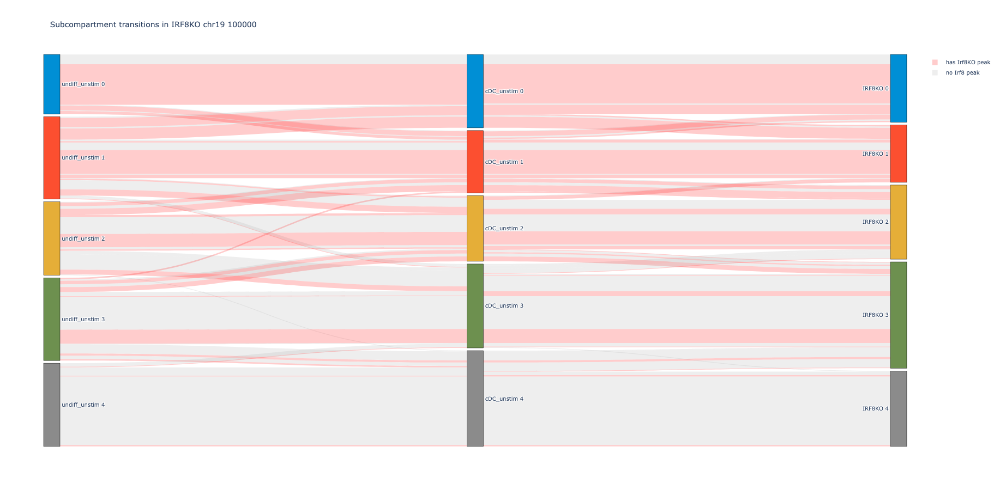

In [188]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [
    [add_alpha("red", 0.2), "has Irf8KO peak"],
    [add_alpha("darkgray", 0.2), "no Irf8 peak"],
]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.binding_Irf8KO.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.binding_Irf8KO.{CHROM}.{BINSIZE}.{title}.png")

In [189]:
title = "IRF8KO"
conditions = ['cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 2
n_clusters = 6

In [190]:
df = bins_region.groupby(cols_states+['has_Irf8_peak']).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [191]:
df.query('nbins>0')

,cluster-transformed:cDC_unstim,cluster-transformed:IRF8KO,has_Irf8_peak,nbins
0,0,0,False,16
1,0,0,True,69
2,0,1,False,2
3,0,1,True,18
12,1,0,False,3
13,1,0,True,9
14,1,1,False,13
15,1,1,True,43
16,1,2,False,5
17,1,2,True,16


In [192]:
dict_colors = {True:'red', False:'darkgray'}

In [193]:
df_nodes, df_links = groups2sankey_extcolor(df, 'has_Irf8_peak', cols_states, n_states, n_clusters, dict_colors)

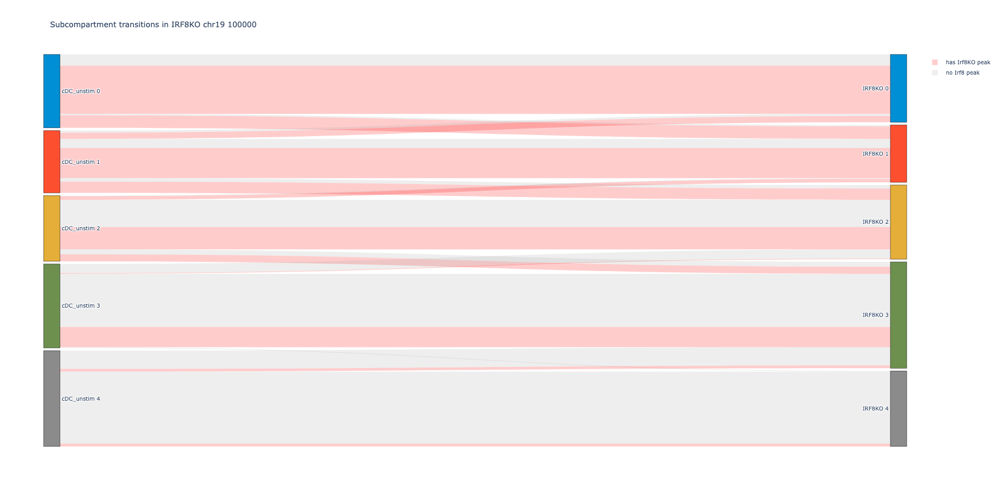

In [194]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [
    [add_alpha("red", 0.2), "has Irf8KO peak"],
    [add_alpha("darkgray", 0.2), "no Irf8 peak"],
]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.binding_Irf8KO.twostate.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.binding_Irf8KO.twostate.{CHROM}.{BINSIZE}.{title}.png")

### Plot sankeys: Irf8KO ATAC-Seq change

In [195]:
# Load ATAC-Seq data:
df_atac_irf = pd.read_table(
    "/net/levsha/share/lab/reizis2020/atac/atacseq-nf/bwa/merged_replicate/macs2/broad_peak/IRF8KO.mRp.clN_peaks.broadPeak",
    header=None
)
df_atac_wt = pd.read_table(
    "/net/levsha/share/lab/reizis2020/atac/atacseq-nf/bwa/merged_replicate/macs2/broad_peak/cDC.mRp.clN_peaks.broadPeak", # Note that it's potentially not the same batch as Irf8 control
    header=None
)

df_atac_irf.columns = ['chrom', 'start', 'end', 'name', 'score', '__', '__', '__', '__']
df_atac_wt.columns = ['chrom', 'start', 'end', 'name', 'score', '__', '__', '__', '__']

In [196]:
df_atac_irf_indep = bioframe.overlap( df_atac_wt, bioframe.expand(df_atac_irf, 500), how='left', return_index=True)\
   .drop_duplicates('index').dropna(subset='index_').reset_index(drop=True).drop(['index'], axis=1)

df_atac_irf_dep = bioframe.overlap( df_atac_wt, bioframe.expand(df_atac_irf, 500), how='left', return_index=True)\
  .drop_duplicates('index')
df_atac_irf_dep = df_atac_irf_dep.loc[pd.isna(df_atac_irf_dep.index_), :].reset_index(drop=True).drop(['index'], axis=1)

In [197]:
# Annotate Irf8KO peaks:

df_overlap = bioframe.overlap(bins_region, df_atac_irf_dep, return_index=True, how='left')
idx = df_overlap.drop_duplicates('index').dropna(subset='index_')['index']
bins_region.loc[:, "n_Irf8_dep"] = df_overlap.dropna(subset='index_').groupby('index').count()['chrom']
bins_region.loc[:, "n_Irf8_dep"] = bins_region.loc[:, "n_Irf8_dep"].replace(np.nan, 0)

df_overlap = bioframe.overlap(bins_region, df_atac_irf_indep, return_index=True, how='left')
idx = df_overlap.drop_duplicates('index').dropna(subset='index_')['index']
bins_region.loc[:, "n_Irf8_indep"] = df_overlap.dropna(subset='index_').groupby('index').count()['chrom']
bins_region.loc[:, "n_Irf8_indep"] = bins_region.loc[:, "n_Irf8_indep"].replace(np.nan, 0)

def assign_agg_peak_type(x):
    if x["n_Irf8_indep"]>x["n_Irf8_dep"]:
        return "independent"
    elif x["n_Irf8_indep"]<x["n_Irf8_dep"]:
        return "dependent"
    elif x["n_Irf8_indep"]==0:
        return "no peak"
    else:
        return "ambiguous"
    
bins_region.loc[:, "Irf8_ATAC_peak"] = bins_region.apply(assign_agg_peak_type, axis=1)


In [198]:
bins_region.groupby("Irf8_ATAC_peak").count()[['chrom']]

,chrom
Irf8_ATAC_peak,
ambiguous,56
dependent,121
independent,229
no peak,209


In [199]:
title = "IRF8KO"
conditions = ['undiff_unstim', 'cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 3
n_clusters = 6

In [200]:
df = bins_region.groupby(cols_states+["Irf8_ATAC_peak"]).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [201]:
df.query('nbins>0')

,cluster-transformed:undiff_unstim,cluster-transformed:cDC_unstim,cluster-transformed:IRF8KO,Irf8_ATAC_peak,nbins
0,0,0,0,ambiguous,4
1,0,0,0,dependent,6
2,0,0,0,independent,60
6,0,0,1,independent,2
25,0,1,0,dependent,1
...,...,...,...,...,...
663,4,3,3,no peak,3
687,4,4,3,no peak,13
689,4,4,4,dependent,13
690,4,4,4,independent,2


In [207]:
dict_colors = {'dependent':'red', 'no peak':'darkgray', 'ambiguous':'lightgray', 'independent':'blue'}

In [208]:
df_nodes, df_links = groups2sankey_extcolor(df, "Irf8_ATAC_peak", cols_states, n_states, n_clusters, dict_colors)

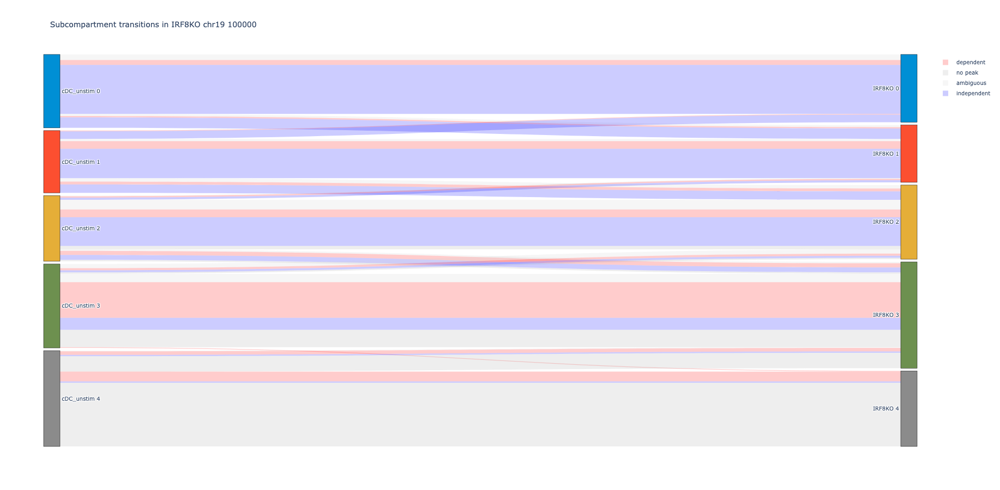

In [209]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [ [add_alpha(dict_colors[k], 0.2), k] for k in dict_colors.keys() ]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.ATAC_peaks_Irf8KO.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.ATAC_peaks_Irf8KO.{CHROM}.{BINSIZE}.{title}.png")

In [210]:
title = "IRF8KO"
conditions = ['cDC_unstim', 'IRF8KO']
cols_states = [f'cluster-transformed:{cond}' for cond in conditions]
n_states = 2
n_clusters = 6

In [211]:
df = bins_region.groupby(cols_states+["Irf8_ATAC_peak"]).count()[['chrom']].reset_index().rename({'chrom':'nbins'}, axis=1)
df = df.loc[df.loc[:, cols_states[0]]!=5, :] # Remove the non-functional state

In [212]:
df.query('nbins>0')

,cluster-transformed:cDC_unstim,cluster-transformed:IRF8KO,Irf8_ATAC_peak,nbins
0,0,0,ambiguous,8
1,0,0,dependent,7
2,0,0,independent,70
4,0,1,ambiguous,3
5,0,1,dependent,2
6,0,1,independent,15
25,1,0,dependent,1
26,1,0,independent,11
28,1,1,ambiguous,3
29,1,1,dependent,11


In [216]:
dict_colors = {'dependent':'red', 'no peak':'darkgray', 'ambiguous':'lightgray', 'independent':'blue'}

In [217]:
df_nodes, df_links = groups2sankey_extcolor(df, "Irf8_ATAC_peak", cols_states, n_states, n_clusters, dict_colors)

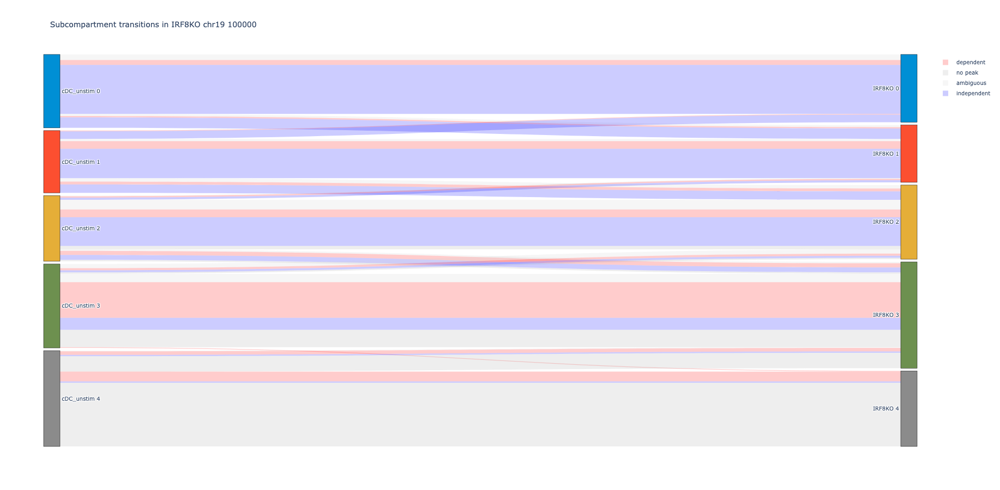

In [218]:
import plotly.graph_objects as go

sankey = go.Sankey(
    arrangement = "fixed",
    node = dict(
      pad = 5,
      thickness = 30,
      line = dict(color = "black", width = 0.5),
      label = df_nodes.apply(lambda x: f"{x.cond} {x.cluster}", axis=1),
      x = df_nodes.x,
      y = [0 for x in range(len(df_nodes))],
      color = df_nodes.color,
    ),
    link = dict(
      source = df_links.left,
      target = df_links.right,
      value = df_links.value,
      color = df_links.color,
  ))



legend = []
legend_entries = [ [add_alpha(dict_colors[k], 0.2), k] for k in dict_colors.keys() ]
for entry in legend_entries:
    legend.append(
        go.Scatter(
            mode="markers",
            x=[None],
            y=[None],
            marker=dict(size=10, color=entry[0], symbol="square"),
            name=entry[1],
        )
    )

traces = [sankey] + legend

fig = go.Figure(data=traces)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(title_text=f"Subcompartment transitions in {title.replace('_', ' ')}\n{CHROM} {BINSIZE}", font_size=10, height=900, width=700, showlegend=True, plot_bgcolor="rgba(0,0,0,0)")

fig.show()

fig.write_image(f"{OUTPUT_FOLDER}/sankey.ATAC_peaks_Irf8KO.twostate.{CHROM}.{BINSIZE}.{title}.pdf")
fig.write_image(f"{OUTPUT_FOLDER}/sankey.ATAC_peaks_Irf8KO.twostate.{CHROM}.{BINSIZE}.{title}.png")